In [1]:
from m_star_predictor import (
    LinearRegression, FCNN, fit_model, 
)

from utility import (
    normalize, real_units, reduce_dataset, compute_rmse
)

import torch
import torch.utils.data as Data
from torch.utils.data import random_split
from torch import optim
import numpy as np
import os

import matplotlib.pyplot as plt

# Ensuring reproducibility
np.random.seed(14)
torch.manual_seed(123);
sklear_random_state = 123

In [2]:
def calculate_rolling_average(
        data: np.ndarray,
        window_size: int
) -> np.ndarray:
    return np.convolve(np.pad(data, pad_width=int(window_size/2), mode="edge"), np.ones(window_size)/window_size, mode='valid')[:-1]

# Trajectories

In [3]:
fcnn_traj_default = np.load('/home/mm6851/m_star_predictors/fcnn_default_inst_predictor_train_test_loss.npy')
fcnn_traj_ysqrt = np.load('/home/mm6851/m_star_predictors/fcnn_ysqrt_default_inst_predictor_train_test_loss.npy')

linear_traj_default = np.load('/home/mm6851/m_star_predictors/linear_default_inst_predictor_train_test_loss.npy')
linear_traj_ysqrt = np.load('/home/mm6851/m_star_predictors/linear_ysqrt_default_inst_predictor_train_test_loss.npy')

FileNotFoundError: [Errno 2] No such file or directory: '/home/mm6851/m_star_predictors/fcnn_default_inst_predictor_train_test_loss.npy'

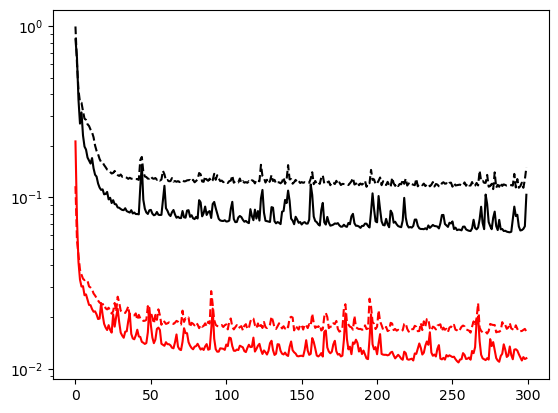

In [3]:
plt.plot(fcnn_traj_default[0], color="black")
plt.plot(fcnn_traj_default[1], color="black", linestyle="dashed")
plt.plot(fcnn_traj_ysqrt[0], color="red")
plt.plot(fcnn_traj_ysqrt[1], color="red", linestyle="dashed")
plt.gca().set_yscale("log")

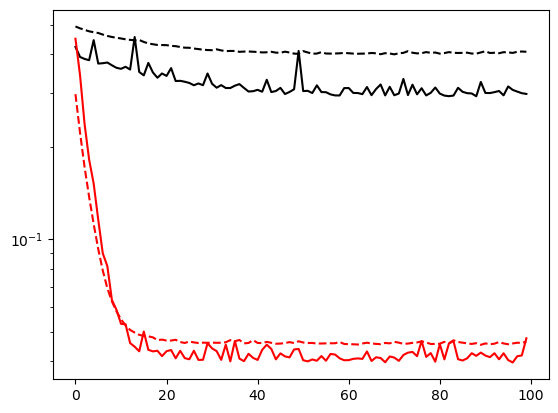

In [4]:
plt.plot(linear_traj_default[0], color="black")
plt.plot(linear_traj_default[1], color="black", linestyle="dashed")
plt.plot(linear_traj_ysqrt[0], color="red")
plt.plot(linear_traj_ysqrt[1], color="red", linestyle="dashed")
plt.gca().set_yscale("log")

In [5]:
# fcnn_traj, fcnn_traj_name = np.load("/home/mm6851/m_star_predictors/fcnn_ysqrt_default_angle_mag_and_b_hist_inst_predictor_train_test_loss.npy"), "angle + mag + bl hist"
fcnn_traj, fcnn_traj_name = np.load("/home/mm6851/m_star_predictors/fcnn_ysqrt_default_bl_included_inst_predictor_train_test_loss.npy"), "bl"
# fcnn_traj, fcnn_traj_name = np.load("/home/mm6851/m_star_predictors/fcnn_ysqrt_default_u_dot_tau_inst_predictor_train_test_loss.npy"), r"$u \cdot \tau$"

In [122]:
plt.plot(fcnn_traj[0], color="black", label=f"{fcnn_traj_name} train loss")
plt.plot(fcnn_traj[1], color="black", linestyle="dashed", label=f"{fcnn_traj_name} test loss")
plt.plot(fcnn_traj_ysqrt[0], color="red", label=f"angle + mag train loss")
plt.plot(fcnn_traj_ysqrt[1], color="red", linestyle="dashed", label=f"angle + mag train loss")
plt.gca().set_yscale("log")
plt.legend()

NameError: name 'fcnn_traj_name' is not defined

In [2]:
fcnn_traj_1, fcnn_name_1 = np.load("/home/mm6851/m_star_predictors/fcnn_ysqrt_dropped_1stIT_nns_32_nls_3_wd_1e-4_relu_NN_SS_angle_mag_inst_predictor_train_test_loss.npy"), "32 neurons, 3 layers, wd=1e-4, relu"
fcnn_traj_2, fcnn_name_2 = np.load("/home/mm6851/m_star_predictors/fcnn_ysqrt_dropped_1stIT_nns_128_nls_3_wd_5e-5_relu_NN_SS_angle_mag_inst_predictor_train_test_loss.npy"), "128 neurons, 3 layers, wd=5e-5, relu"
fcnn_traj_3, fcnn_name_3 = np.load("/home/mm6851/m_star_predictors/fcnn_ysqrt_dropped_1stIT_nns_128_nls_3_wd_5e-5_tanh_NN_SS_angle_mag_inst_predictor_train_test_loss.npy"), "128 neurons, 3 layers, wd=5e-5, tanh"

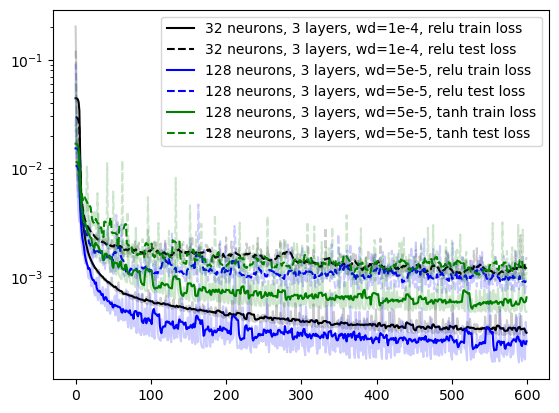

In [6]:
plt.plot(fcnn_traj_1[0], color="black", alpha=0.2)
plt.plot(calculate_rolling_average(fcnn_traj_1[0], 10), color="black", label=f"{fcnn_name_1} train loss")
plt.plot(fcnn_traj_1[1], color="black", linestyle="dashed", alpha=0.2)
plt.plot(calculate_rolling_average(fcnn_traj_1[1], 10), color="black", label=f"{fcnn_name_1} test loss", linestyle="dashed")
plt.plot(fcnn_traj_2[0], color="blue", alpha=0.2)
plt.plot(calculate_rolling_average(fcnn_traj_2[0], 10), color="blue", label=f"{fcnn_name_2} train loss")
plt.plot(fcnn_traj_2[1], color="blue", linestyle="dashed", alpha=0.2)
plt.plot(calculate_rolling_average(fcnn_traj_2[1], 10), color="blue", label=f"{fcnn_name_2} test loss", linestyle="dashed")
plt.plot(fcnn_traj_3[0], color="green", alpha=0.2)
plt.plot(calculate_rolling_average(fcnn_traj_3[0], 10), color="green", label=f"{fcnn_name_3} train loss")
plt.plot(fcnn_traj_3[1], color="green", linestyle="dashed", alpha=0.2)
plt.plot(calculate_rolling_average(fcnn_traj_3[1], 10), color="green", label=f"{fcnn_name_3} test loss", linestyle="dashed")
plt.gca().set_yscale("log")
plt.legend()

In [110]:
fcnn_traj = np.load("m_star_predictors/fcnn_ysqrt_dropped_1stIT_nns_128_nls_3_wd_5e-5_relu_NN_SS_angle_mag_inst_predictor_train_test_loss.npy")

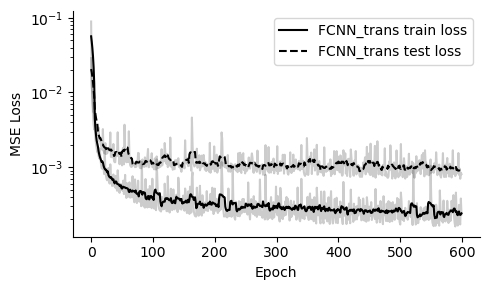

In [131]:
plt.figure(figsize=(5,3), tight_layout=True)
plt.plot(fcnn_traj[0], color="black", alpha=.2, label=f"_no_label_")
plt.plot(calculate_rolling_average(fcnn_traj[0], 10), color="black", label=f"FCNN_trans train loss")
plt.plot(fcnn_traj[1], color="black", alpha=.2, label=f"_no_label_")
plt.plot(calculate_rolling_average(fcnn_traj[1], 10), color="black", linestyle="dashed", label=f"FCNN_trans test loss")
plt.gca().set_yscale("log")
plt.legend()
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.ylabel("MSE Loss")
plt.xlabel("Epoch")

plt.savefig("inst_predictor_training_trajectory.png", dpi=600)

# Predictions

In [3]:
def get_predictions(
        data,
        validation_data,
        indices,
        path_to_weights,
        n_hidden_layers = 1,
        n_neurons = 16,
        activation = torch.nn.ReLU()

):
    X, y = data.T[:,indices].float(), data.T[:,-1].unsqueeze(1).float()
    X_val, y_val = validation_data.T[:,indices].float(), validation_data.T[:,-1].unsqueeze(1).float()
    fcnn_network = FCNN(input_size=len(indices), n_neurons=n_neurons, n_hidden_layers=n_hidden_layers, activation=activation)

    state_dict = torch.load(path_to_weights, map_location=torch.device('cpu'))
    fcnn_network.load_state_dict(state_dict)

    X_mean = X.mean(dim=0)
    X_std = X.std(dim=0)
    y_mean = y.sqrt().mean(dim=0)
    y_std = 2*y.sqrt().std(dim=0)

    X_normalized = normalize(data=X, mean=X_mean, std=X_std)
    fcnn_prediction = real_units(normalized_data=fcnn_network(X_normalized), mean=y_mean, std=y_std)**2

    X_val_normalized = normalize(data=X_val, mean=X_mean, std=X_std)
    fcnn_prediction_val = real_units(normalized_data=fcnn_network(X_val_normalized), mean=y_mean, std=y_std)**2

    norm = X_mean, X_std, y_mean, y_std

    return X, y, X_val, y_val, norm, fcnn_network, fcnn_prediction, fcnn_prediction_val


In [4]:
data_directory = '../m_star_dataset'

dataset_name = 'ePBL_paper_expanded_2283_corrected'
validation_dataset_name = 'ePBL_paper_validation_2283_corrected'
dataset_filename = f"{dataset_name}_dataset_M_target.pt"
validation_dataset_filename = f"{validation_dataset_name}_dataset_M_target.pt"

smooth_dataset_filename = f"{dataset_name}_dataset_M_target_bl_smoothed.pt"
smooth_validation_dataset_filename = f"{validation_dataset_name}_dataset_M_target_bl_smoothed.pt"
smooth_data = torch.load(os.path.join(data_directory, smooth_dataset_filename))
smooth_validation_data = torch.load(os.path.join(data_directory, smooth_validation_dataset_filename))

dropped_1stT_dataset_filename = f"{dataset_name}_dataset_M_target_dropped_first_inertial_T.pt"
dropped_1stT_validation_dataset_filename = f"{validation_dataset_name}_dataset_M_target_dropped_first_inertial_T.pt"
dropped_1stT_data = torch.load(os.path.join(data_directory, dropped_1stT_dataset_filename))
dropped_1stT_validation_data = torch.load(os.path.join(data_directory, dropped_1stT_validation_dataset_filename))

data = torch.load(os.path.join(data_directory, dataset_filename))
validation_data = torch.load(os.path.join(data_directory, validation_dataset_filename))
ows_papa_data = torch.load(os.path.join(data_directory, "ows_papa_2015_sane23_dataset_M_target.pt"))

In [5]:
mean_dataset_filename = f"{dataset_name}_mean_dataset_M_target.pt"
mean_data = torch.load(os.path.join(data_directory, mean_dataset_filename))

In [6]:
# X_mp, y_mp = data.T[:,:4].float(), data.T[:,-1].unsqueeze(1).float()
# X_val_mp, y_val_mp = validation_data.T[:,:4].float(), validation_data.T[:,-1].unsqueeze(1).float()
X_mp, y_mp = dropped_1stT_data.T[:,:4].float(), dropped_1stT_data.T[:,-1].unsqueeze(1).float()
X_val_mp, y_val_mp = dropped_1stT_validation_data.T[:,:4].float(), dropped_1stT_validation_data.T[:,-1].unsqueeze(1).float()

In [7]:
X_m, y_m = mean_data.T[:,:4].float(), mean_data.T[:,-1].unsqueeze(1).float()

X_mp_mean = X_m.mean(dim=0)
X_mp_std = X_m.std(dim=0)
y_mp_mean = y_m.mean(dim=0)
y_mp_std = y_m.std(dim=0)

In [8]:
fcnn_mean = FCNN(input_size=4)
path_to_weights = "/home/mm6851/m_star_predictor/m_star_predictors/fcnn_mean_predictor_weights.pth"
state_dict = torch.load(path_to_weights, map_location=torch.device('cpu'))
fcnn_mean.load_state_dict(state_dict)

<All keys matched successfully>

In [9]:
X_mp_normalized = normalize(data=X_mp, mean=X_mp_mean, std=X_mp_std)
mean_prediction = real_units(normalized_data=fcnn_mean(X_mp_normalized), mean=y_mp_mean, std=y_mp_std)

X_val_mp_normalized = normalize(data=X_val_mp, mean=X_mp_mean, std=X_mp_std)
mean_prediction_val = real_units(normalized_data=fcnn_mean(X_val_mp_normalized), mean=y_mp_mean, std=y_mp_std)

Text(0.5, 0, '$M_{pred}$')

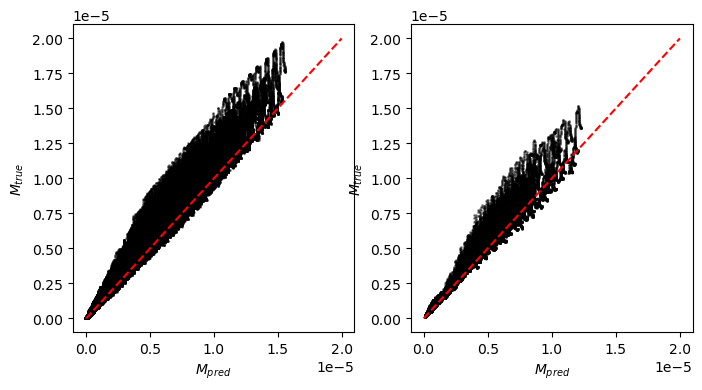

In [10]:
xs, ys = np.linspace(0., 2e-5, 1000), np.linspace(0., 2e-5, 1000)

fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].scatter(mean_prediction.detach().numpy(), y_mp, color="black", s=1, alpha=.4)
ax[0].plot(xs, ys, color="red", linestyle="dashed")
ax[0].set_ylabel("$M_{true}$")
ax[0].set_xlabel("$M_{pred}$")

ax[1].scatter(mean_prediction_val.detach().numpy(), y_val_mp, color="black", s=1, alpha=.4)
ax[1].plot(xs, ys, color="red", linestyle="dashed")
ax[1].set_ylabel("$M_{true}$")
ax[1].set_xlabel("$M_{pred}$")

# plt.savefig("inst_M_true_pred_mean_predictor.png", dpi=300)

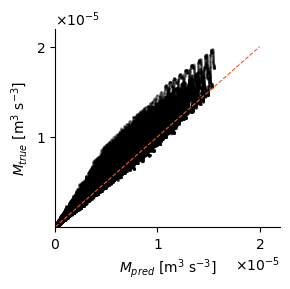

In [13]:
xs, ys = np.linspace(0., 2e-5, 1000), np.linspace(0., 2e-5, 1000)

fig, ax = plt.subplots(1,1,figsize=(3,3))
ax.scatter(mean_prediction.detach().numpy(), y_mp, color="black", s=1, alpha=.2,)
ax.scatter(mean_prediction_val.detach().numpy(), y_val_mp, color="black", s=1, alpha=.2)
ax.plot(xs, ys, color="#f15a29", linestyle="dashed", linewidth=0.8)
ax.set_yticks([1e-5, 2e-5])
ax.set_xticks([0, 1e-5, 2e-5])
ax.set_xlim(0, 2.2e-5)
ax.set_ylim(0, 2.2e-5)
ax.set_ylabel("$M_{true}$ [m$^3$ s$^{-3}$]")
ax.set_xlabel("$M_{pred}$ [m$^3$ s$^{-3}$]")
ax.ticklabel_format(style='sci', useMathText=True, scilimits=(-2, 2), axis='both')

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

fig.tight_layout()

plt.savefig("inst_M_true_pred_mean_predictor.png", dpi=600)

In [15]:
dataset_selection = "bl_included"
filename = f"_{dataset_selection}"

if dataset_selection == "angle_mag":
    indices = [0,1,2,3,4,5]
    filename = ""
elif dataset_selection == "angle_mag_and_b_hist":
    indices = [0,1,2,3,4,5,7]
elif dataset_selection == "u_dot_tau":
    indices = [0,1,2,3,6]
elif dataset_selection == "bl_included":
    indices = [0,1,2,3,4,5,7,8,9,10,11]
#     indices = [0,1,2,3,4,5,7,10,11]
elif dataset_selection == "ss_nn":
    indices = [0,1,2,3,10,11]

In [16]:
X, y = data.T[:,indices].float(), data.T[:,-1].unsqueeze(1).float()
X_val, y_val = validation_data.T[:,indices].float(), validation_data.T[:,-1].unsqueeze(1).float()

In [17]:
fcnn_network = FCNN(input_size=len(indices))

In [18]:
path_to_weights = f"/home/mm6851/m_star_predictors/fcnn_ysqrt_default{filename}_inst_predictor_weights.pth"
state_dict = torch.load(path_to_weights, map_location=torch.device('cpu'))
fcnn_network.load_state_dict(state_dict)

FileNotFoundError: [Errno 2] No such file or directory: '/home/mm6851/m_star_predictors/fcnn_ysqrt_default_bl_included_inst_predictor_weights.pth'

In [138]:
X_mean = X.mean(dim=0)
X_std = X.std(dim=0)
y_mean = y.mean(dim=0)
y_std = y.std(dim=0)
y_sqrt_mean = y.sqrt().mean(dim=0)
y_sqrt_std = 2*y.sqrt().std(dim=0)
sqrt = True

if sqrt:
    X_normalized = normalize(data=X, mean=X_mean, std=X_std)
    fcnn_prediction = real_units(normalized_data=fcnn_network(X_normalized), mean=y_sqrt_mean, std=y_sqrt_std)**2

    X_val_normalized = normalize(data=X_val, mean=X_mean, std=X_std)
    fcnn_prediction_val = real_units(normalized_data=fcnn_network(X_val_normalized), mean=y_sqrt_mean, std=y_sqrt_std)**2

else:
    X_normalized = normalize(data=X, mean=X_mean, std=X_std)
    fcnn_prediction = real_units(normalized_data=fcnn_network(X_normalized), mean=y_mean, std=y_std)

    X_val_normalized = normalize(data=X_val, mean=X_mean, std=X_std)
    fcnn_prediction_val = real_units(normalized_data=fcnn_network(X_val_normalized), mean=y_mean, std=y_std)


Text(0.5, 1.0, 'Test set')

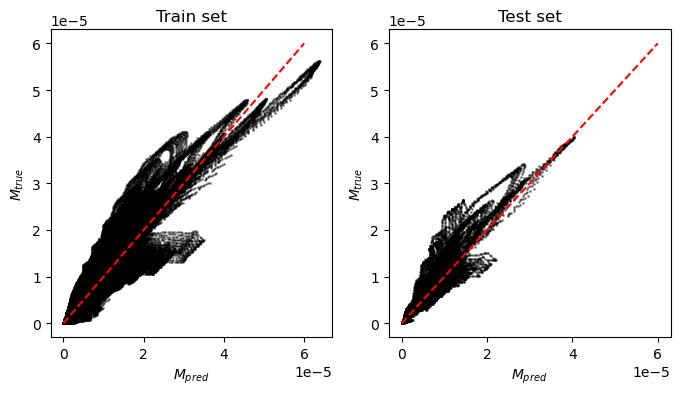

In [51]:
xs, ys = np.linspace(0., 6e-5, 1000), np.linspace(0., 6e-5, 1000)

fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].scatter(fcnn_prediction.detach().numpy(), y, color="black", s=1, alpha=.4)
ax[0].plot(xs, ys, color="red", linestyle="dashed")
ax[0].set_ylabel("$M_{true}$")
ax[0].set_xlabel("$M_{pred}$")
ax[0].set_title("Train set")

ax[1].scatter(fcnn_prediction_val.detach().numpy(), y_val, color="black", s=1, alpha=.4)
ax[1].plot(xs, ys, color="red", linestyle="dashed")
ax[1].set_ylabel("$M_{true}$")
ax[1].set_xlabel("$M_{pred}$")
ax[1].set_title("Test set")

# plt.savefig("inst_M_true_pred_with_utau.png", dpi=300)

In [84]:
compute_rmse(fcnn_prediction_val, y_val)

tensor(1.4386e-06, grad_fn=<SqrtBackward0>)

In [85]:
compute_rmse(mean_prediction_val, y_val_mp)

tensor(3.0240e-06, grad_fn=<SqrtBackward0>)

In [17]:
import json

with open(os.path.join(data_directory, f'{dataset_name}_training_set_cases.json'), 'r') as file:
    gotm_case_dict = json.load(file)

with open(os.path.join(data_directory, f'{validation_dataset_name}_training_set_cases.json'), 'r') as file:
    gotm_validation_case_dict = json.load(file)

/tmp/ipykernel_2149012/4251756819.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(tight_layout=True)


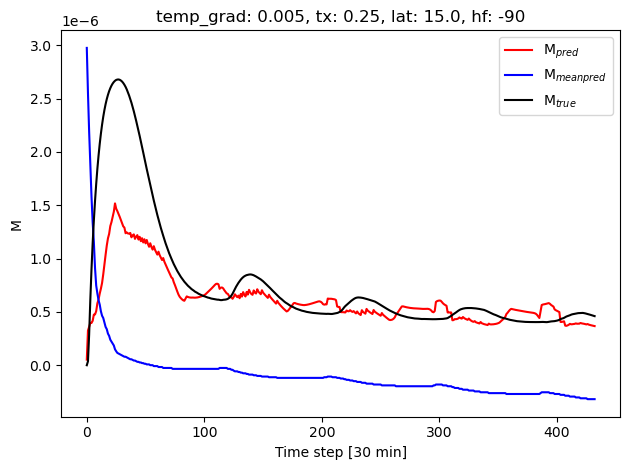

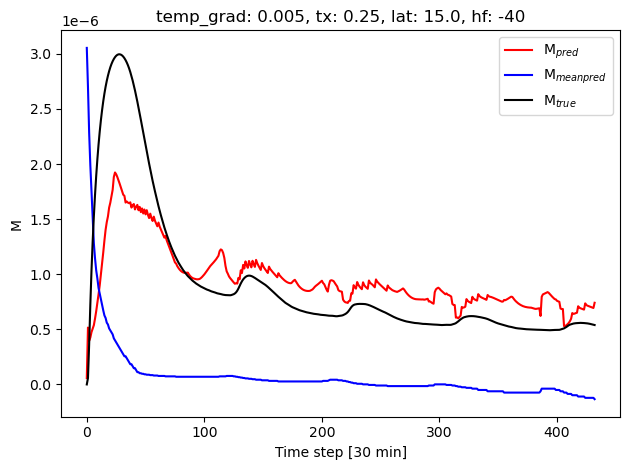

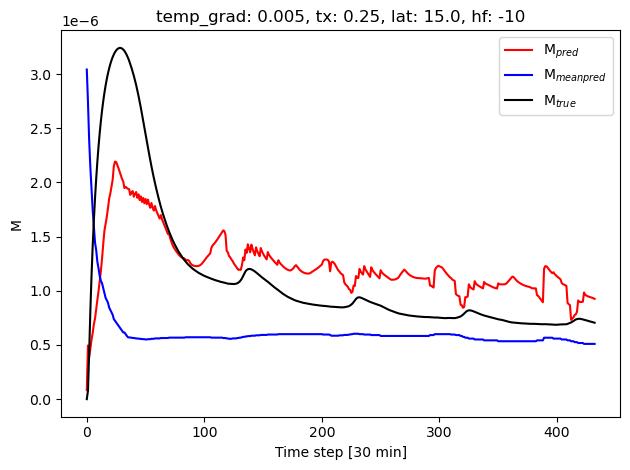

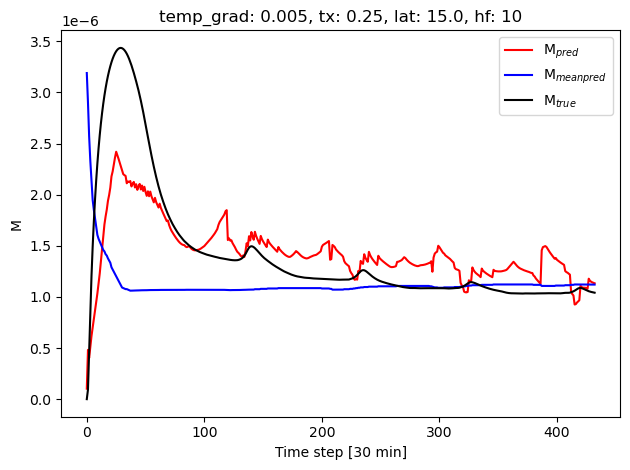

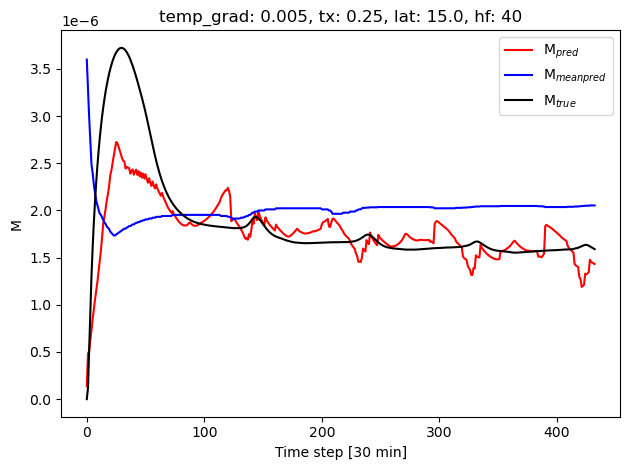

...

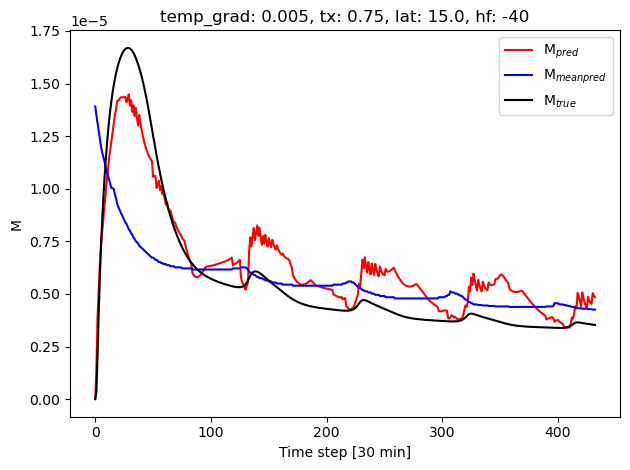

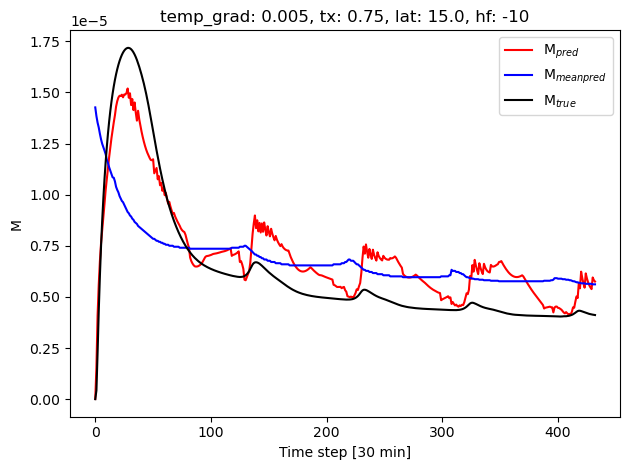

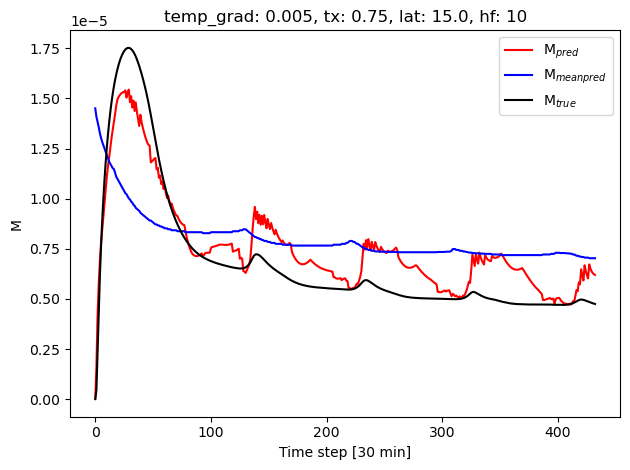

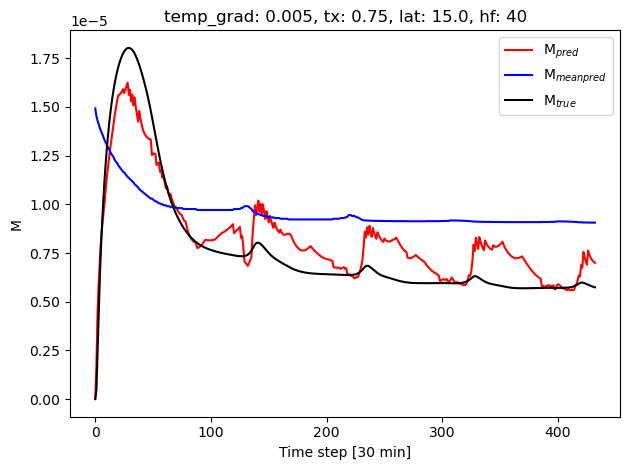

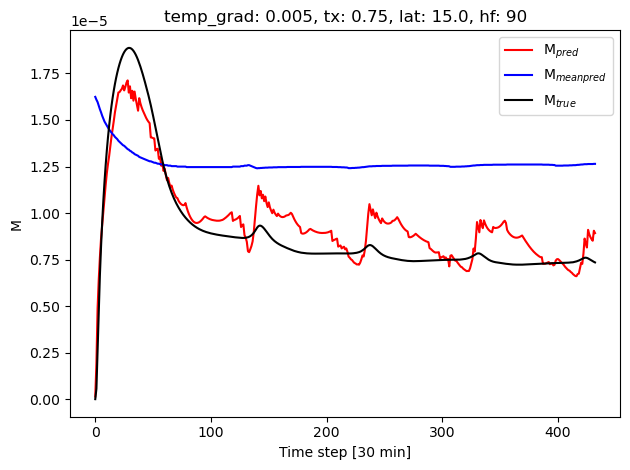

In [102]:
for i in range(30):
    case_specs = gotm_validation_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    plt.figure(tight_layout=True)
    plt.title(f"temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    plt.plot(fcnn_prediction_val.detach().numpy()[433*i:433*(i+1)], label="M$_{pred}$", color="red")
    plt.plot(mean_prediction_val.detach().numpy()[433*i:433*(i+1)], label="M$_{mean pred}$", color="blue")
    plt.plot(y_val[433*i:433*(i+1)], label="M$_{true}$", color="black")
    plt.xlabel("Time step [30 min]")
    plt.ylabel("M")
    plt.legend()

1 4 0.01 0.027906505500569063 0.03822439601644874
1 4 0.0001 0.02507367165868773 0.03326041284017265
1 8 0.01 0.025365276700433564 0.03243270688690245
1 8 0.0001 0.014003675814498873 0.019374751159921287
1 16 0.01 0.02402672335943755 0.031193687580525875
1 16 0.0001 0.009801994050469469 0.016304978216066957
2 4 0.01 0.023460425600847778 0.03122787121683359
2 4 0.0001 0.021294537835809237 0.027771155443042518
2 8 0.01 0.0226153134204009 0.02713740710169077
2 8 0.0001 0.012867712306187433 0.01856531426310539
2 16 0.01 0.021339149159543654 0.027637102315202354
2 16 0.0001 0.009694891981780529 0.015607208013534546
3 4 0.01 0.24455715891192942 0.30363656058907507
3 4 0.0001 0.02920131933163194 0.03723211502656341
3 8 0.01 0.02252581397838452 0.02989613078534603
3 8 0.0001 0.014502265066017999 0.02037615771405399
3 16 0.01 0.023814336780239555 0.026409815810620785
3 16 0.0001 0.009989105671753777 0.017007073760032652


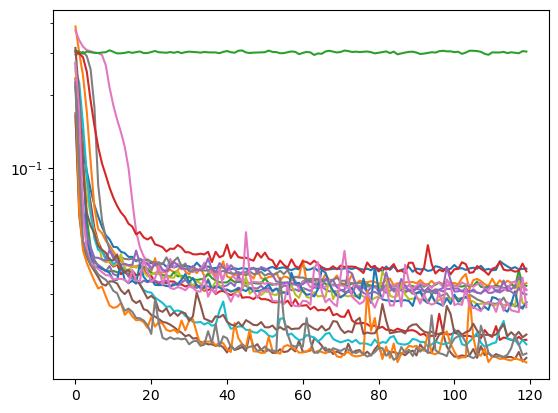

In [112]:
n_layers_list = [1, 2, 3]
n_neurons_list = [4, 8, 16]
weight_decays = [1e-2, 1e-4]
train_losses = []
test_losses = []

for n_layers in n_layers_list:
    for n_neurons in n_neurons_list:
        for weight_decay in weight_decays:
            fcnn_traj = np.load(f'../m_star_predictors/fcnn_ysqrt_nns_{n_neurons}_nls_{n_layers}_wd_{weight_decay}_inst_predictor_train_test_loss.npy')
            train_losses.append(fcnn_traj[0,-1])
            test_losses.append(fcnn_traj[1,-1])
            print(n_layers, n_neurons, weight_decay, fcnn_traj[0,-1], fcnn_traj[1,-1])
            plt.plot(fcnn_traj[1,:])
            plt.gca().set_yscale("log")

# OWS PAPA

In [15]:
X_ows, y_ows = ows_papa_data.T[:,indices].float(), ows_papa_data.T[:,-1].unsqueeze(1).float()

In [16]:
X_ows.shape

torch.Size([8760, 8])

In [17]:
X_ows_normalized = normalize(data=X_ows, mean=X_mean, std=X_std)

In [18]:
fcnn_ows_prediction_bl = real_units(normalized_data=fcnn_network(X_ows_normalized), mean=y_mean, std=y_std)**2

In [141]:
fcnn_ows_prediction_am = real_units(normalized_data=fcnn_network(X_ows_normalized), mean=y_sqrt_mean, std=y_sqrt_std)**2

In [19]:
X_ows_mp_normalized = normalize(data=X_ows[:,:4], mean=X_mp_mean, std=X_mp_std)

In [20]:
mean_ows_prediction = real_units(normalized_data=fcnn_mean(X_ows_mp_normalized), mean=y_mp_mean, std=y_mp_std)

(array([8.400e+01, 6.340e+02, 2.689e+03, 4.564e+03, 6.160e+02, 1.300e+02,
        3.200e+01, 6.000e+00, 4.000e+00, 1.000e+00]),
 array([-2.3775689e-07, -1.7466796e-07, -1.1157901e-07, -4.8490076e-08,
         1.4598863e-08,  7.7687801e-08,  1.4077673e-07,  2.0386568e-07,
         2.6695463e-07,  3.3004355e-07,  3.9313250e-07], dtype=float32),
 <BarContainer object of 10 artists>)

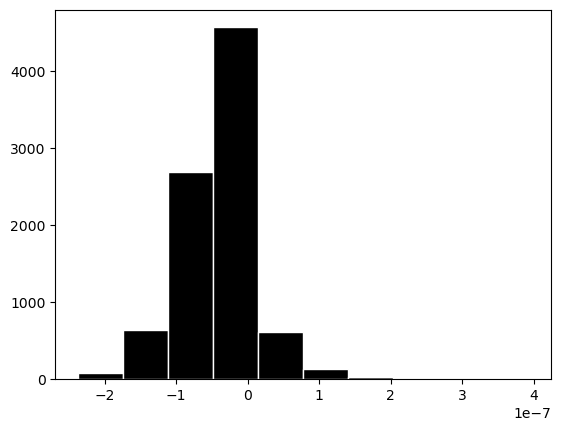

In [200]:
plt.hist(X_ows[:,3].detach().numpy(), color="black", ec="white")

(array([ 19190., 210867., 390151., 366959., 249462.,  98683.,  42600.,
         18009.,   6295.,    704.]),
 array([0.        , 0.16266683, 0.32533365, 0.4880005 , 0.6506673 ,
        0.81333417, 0.976001  , 1.1386678 , 1.3013346 , 1.4640015 ,
        1.6266683 ], dtype=float32),
 <BarContainer object of 10 artists>)

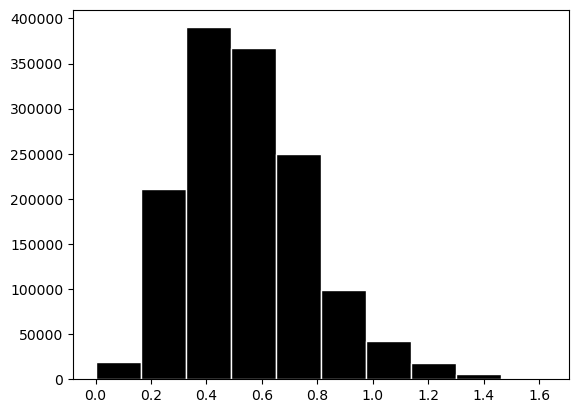

In [193]:
plt.hist(X[:,5].detach().numpy(), color="black", ec="white")

Text(0.5, 1.0, 'Instantenous predictior')

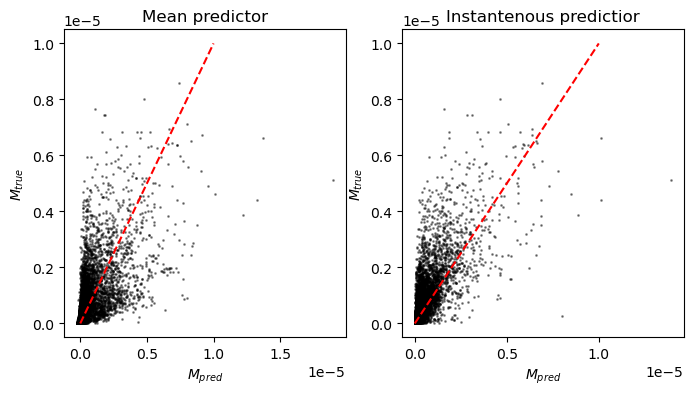

In [21]:
xs, ys = np.linspace(0., 1e-5, 1000), np.linspace(0., 1e-5, 1000)

fig, ax = plt.subplots(1,2,figsize=(8,4))
ax[0].scatter(mean_ows_prediction.detach().numpy(), y_ows, color="black", s=1, alpha=.4)
ax[0].plot(xs, ys, color="red", linestyle="dashed")
ax[0].set_ylabel("$M_{true}$")
ax[0].set_xlabel("$M_{pred}$")
ax[0].set_title("Mean predictor")

ax[1].scatter(fcnn_ows_prediction_bl.detach().numpy(), y_ows, color="black", s=1, alpha=.4)
ax[1].plot(xs, ys, color="red", linestyle="dashed")
ax[1].set_ylabel("$M_{true}$")
ax[1].set_xlabel("$M_{pred}$")
ax[1].set_title("Instantenous predictior")

# plt.savefig("inst_M_true_pred_with_utau.png", dpi=300)

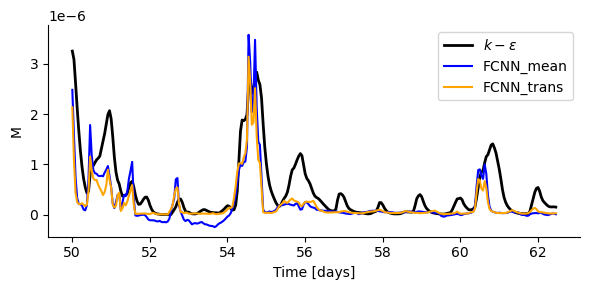

In [40]:
time_range = slice(1200,1500)
time = np.linspace(0,365,len(y_ows.detach().numpy()))

plt.figure(figsize=(6,3), tight_layout=True)

plt.plot(time[time_range], y_ows.detach().numpy()[time_range], color="black", linewidth=2, label="$k-\epsilon$")
plt.plot(time[time_range], mean_ows_prediction.detach().numpy()[time_range], color="blue", label="FCNN_mean")
plt.plot(time[time_range], fcnn_ows_prediction_bl.detach().numpy()[time_range], color="orange", label="FCNN_trans")
# plt.plot(time[range], fcnn_ows_prediction_am.detach().numpy()[range], color="gray", label="inst predictor surf")
plt.ylabel("M")
plt.xlabel("Time [days]")
# plt.ylim(-1e-6, 5e-6)

plt.legend()

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

plt.savefig("ows_M_time_series_comparison.png", dpi=300)

Text(0.5, 0, 'Time [days]')

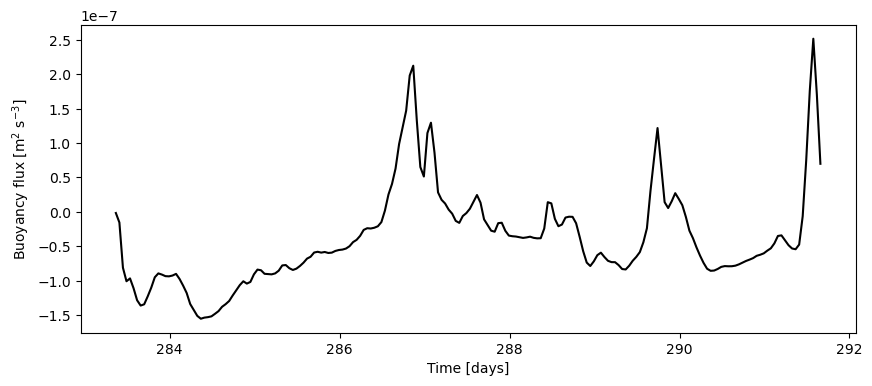

In [ ]:
plt.figure(figsize=(10,4))
plt.plot(time[time_range], X_ows[time_range,3].detach().numpy(), color="black")
plt.ylabel("Buoyancy flux [m$^2$ s$^{-3}$]")
plt.xlabel("Time [days]")

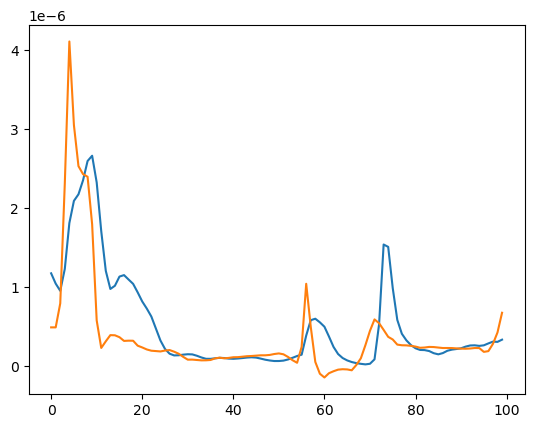

In [ ]:
plt.plot(y_ows.detach().numpy()[0:100])


In [38]:
datasets = ["u_dot_tau", "angle_mag", "bl_included"]
filenames = ["_u_dot_tau", "", "_bl_included"]
indices_list = [
    [0,1,2,3,6],
    [0,1,2,3,4,5],
    [0,1,2,3,4,5,7,8,9,10,11]
]

predictions = []
val_predictions = []

for dataset, filename, indices in zip(datasets, filenames, indices_list):
    X, y = data.T[:,indices].float(), data.T[:,-1].unsqueeze(1).float()
    X_val, y_val = validation_data.T[:,indices].float(), validation_data.T[:,-1].unsqueeze(1).float()

    fcnn_network = FCNN(input_size=len(indices))

    path_to_weights = f"/home/mm6851/m_star_predictors/fcnn_ysqrt_default{filename}_inst_predictor_weights.pth"
    state_dict = torch.load(path_to_weights, map_location=torch.device('cpu'))
    fcnn_network.load_state_dict(state_dict)

    X_mean = X.mean(dim=0)
    X_std = X.std(dim=0)
    y_sqrt_mean = y.sqrt().mean(dim=0)
    y_sqrt_std = 2*y.sqrt().std(dim=0)

    X_normalized = normalize(data=X, mean=X_mean, std=X_std)
    predictions.append(real_units(normalized_data=fcnn_network(X_normalized), mean=y_sqrt_mean, std=y_sqrt_std)**2)

    X_val_normalized = normalize(data=X_val, mean=X_mean, std=X_std)
    val_predictions.append(real_units(normalized_data=fcnn_network(X_val_normalized), mean=y_sqrt_mean, std=y_sqrt_std)**2)

/tmp/ipykernel_2164419/1594790806.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(tight_layout=True)


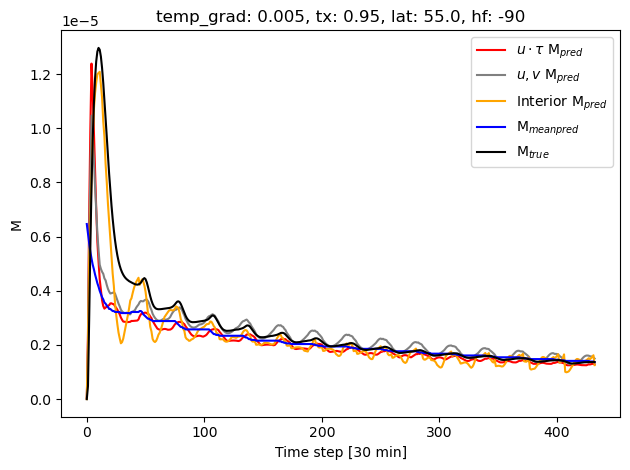

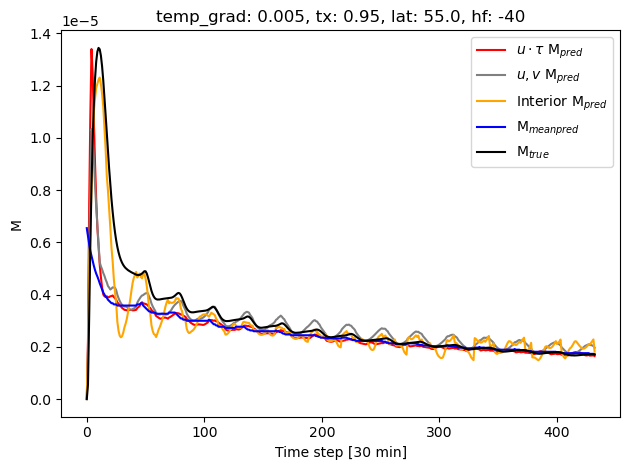

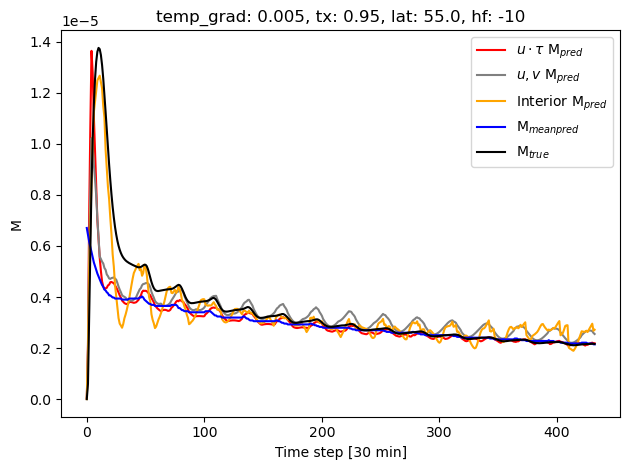

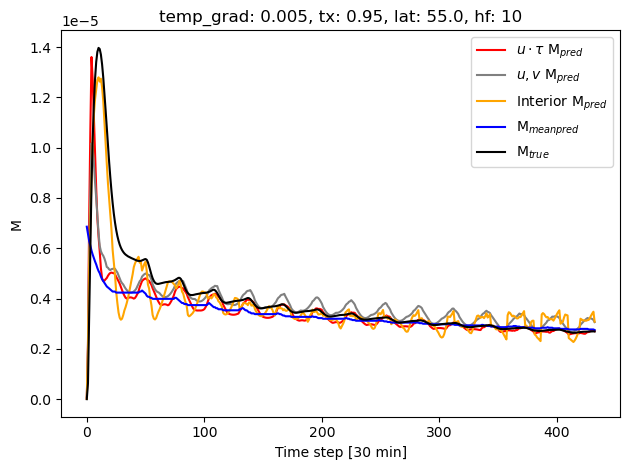

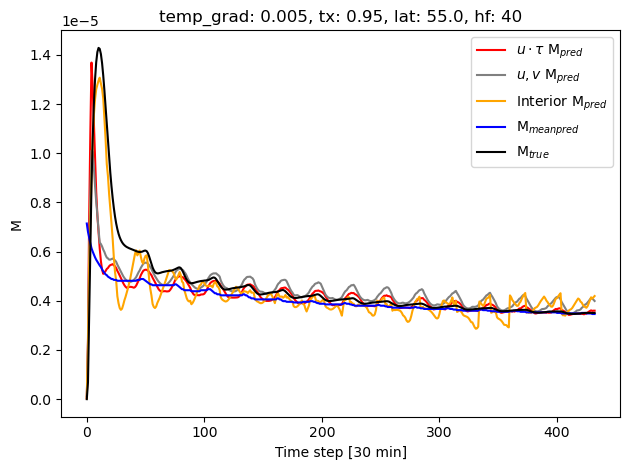

...

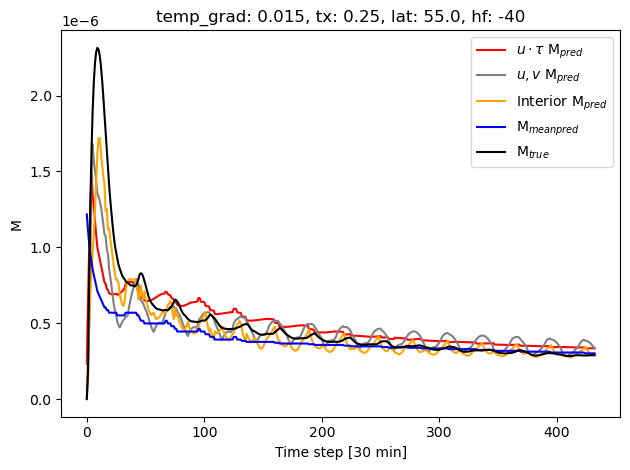

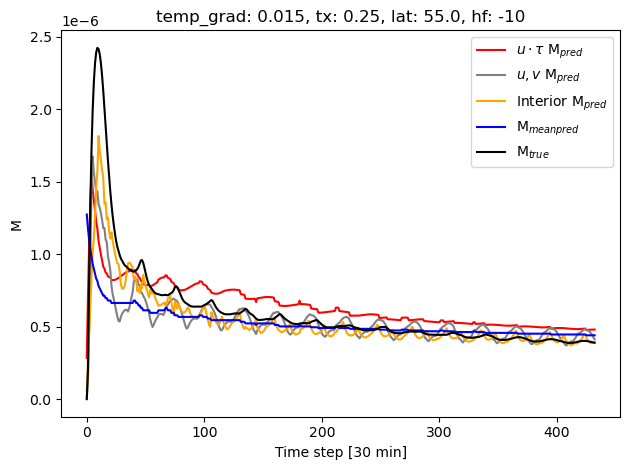

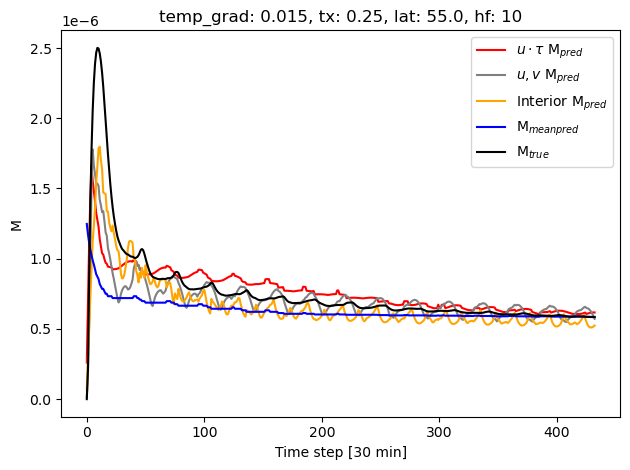

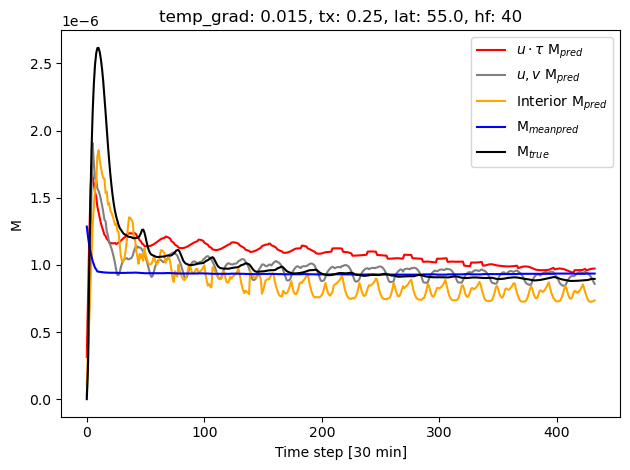

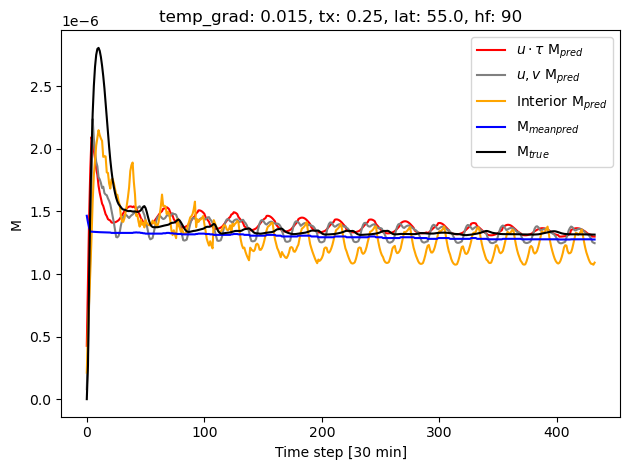

In [ ]:
for i in time_range(60,90):
    case_specs = gotm_validation_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    plt.figure(tight_layout=True)
    plt.title(f"temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    plt.plot(val_predictions[0].detach().numpy()[433*i:433*(i+1)], label=r"$u \cdot \tau$ M$_{pred}$", color="red")
    plt.plot(val_predictions[1].detach().numpy()[433*i:433*(i+1)], label=r"$u,v$ M$_{pred}$", color="gray")
    plt.plot(val_predictions[2].detach().numpy()[433*i:433*(i+1)], label=r"Interior M$_{pred}$", color="orange")
    plt.plot(mean_prediction_val.detach().numpy()[433*i:433*(i+1)], label="M$_{mean pred}$", color="blue")
    plt.plot(y_val[433*i:433*(i+1)], label="M$_{true}$", color="black")
    plt.xlabel("Time step [30 min]")
    plt.ylabel("M")
    plt.legend()

# Dropped 1st Inertial T

In [10]:
indices = [0,1,2,3,4,5,10,11]

X, y, X_val, y_val, norm, fcnn_network, fcnn_prediction, fcnn_prediction_val = get_predictions(
    data=dropped_1stT_data,
    validation_data=dropped_1stT_validation_data,
    indices=indices,
    path_to_weights="m_star_predictors/fcnn_ysqrt_dropped_1stIT_nns_128_nls_3_wd_5e-5_relu_NN_SS_angle_mag_inst_predictor_weights.pth",
    n_hidden_layers=3,
    n_neurons=128,
    activation=torch.nn.ReLU()
)

In [11]:
X_mean, X_std, y_mean, y_std = norm

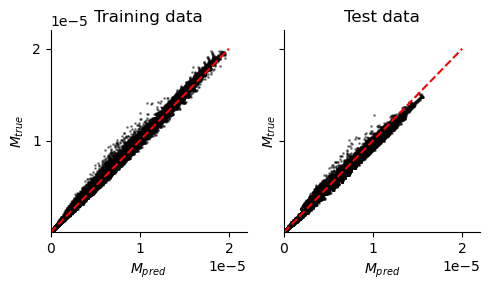

In [13]:
xs, ys = np.linspace(0., 2e-5, 1000), np.linspace(0., 2e-5, 1000)

fig, ax = plt.subplots(1,2,figsize=(5,3), tight_layout=True, sharey=True)
ax[0].scatter(fcnn_prediction.detach().numpy(), y, color="black", s=1, alpha=.4)
ax[0].plot(xs, ys, color="red", linestyle="dashed")
ax[0].set_ylabel("$M_{true}$")
ax[0].set_xlabel("$M_{pred}$")
ax[0].set_title("Training data")
ax[0].set_yticks([1e-5, 2e-5])
ax[0].set_ylim(0, 2.2e-5)
ax[0].set_xlim(0, 2.2e-5)

ax[1].scatter(fcnn_prediction_val.detach().numpy(), y_val, color="black", s=1, alpha=.4)
ax[1].plot(xs, ys, color="red", linestyle="dashed")
ax[1].set_ylabel("$M_{true}$")
ax[1].set_xlabel("$M_{pred}$")
ax[1].set_title("Test data")
ax[1].set_xlim(0, 2.2e-5)

for a in ax.flatten():
    a.spines['top'].set_visible(False)
    a.spines['right'].set_visible(False)

plt.savefig("inst_M_true_pred_inst_predictor.png", dpi=600)

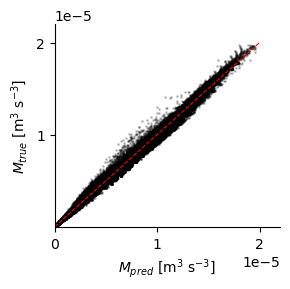

In [61]:
xs, ys = np.linspace(0., 2e-5, 1000), np.linspace(0., 2e-5, 1000)

fig, ax = plt.subplots(1,1,figsize=(3,3))
ax.scatter(fcnn_prediction.detach().numpy(), y_mp, color="black", s=1, alpha=.2,)
ax.scatter(fcnn_prediction_val.detach().numpy(), y_val_mp, color="black", s=1, alpha=.2)
ax.plot(xs, ys, color="red", linestyle="dashed", linewidth=0.8)
ax.set_yticks([1e-5, 2e-5])
ax.set_xticks([0, 1e-5, 2e-5])
ax.set_xlim(0, 2.2e-5)
ax.set_ylim(0, 2.2e-5)
ax.set_ylabel("$M_{true}$ [m$^3$ s$^{-3}$]")
ax.set_xlabel("$M_{pred}$ [m$^3$ s$^{-3}$]")

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)

fig.tight_layout()

plt.savefig("inst_M_true_pred_inst_predictor.png", dpi=600)

In [22]:
compute_rmse(fcnn_prediction_val, y_val)

tensor(2.0891e-07, grad_fn=<SqrtBackward0>)

In [23]:
compute_rmse(mean_prediction_val, y_val_mp)

tensor(6.4600e-07, grad_fn=<SqrtBackward0>)

(array([ 1738.,  2423.,  3883.,  7471., 19738., 35635.,  2366.,   937.,
          600.,   410.,   179.]),
 array([-1.1e-06, -9.0e-07, -7.0e-07, -5.0e-07, -3.0e-07, -1.0e-07,
         1.0e-07,  3.0e-07,  5.0e-07,  7.0e-07,  9.0e-07,  1.1e-06]),
 <BarContainer object of 11 artists>)

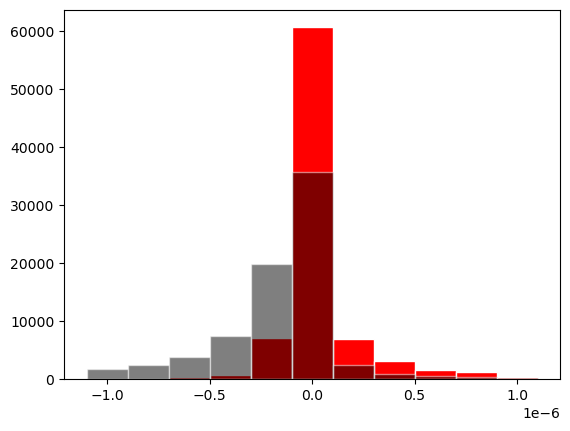

In [39]:
plt.hist((fcnn_prediction_val-y_val).detach().numpy(), np.arange(-1.1e-6,1.1e-6,2e-7), color="red", ec="white")
plt.hist((mean_prediction_val-y_val_mp).detach().numpy(), np.arange(-1.1e-6,1.1e-6,2e-7), color="black", ec="white", alpha=0.5)

(array([  146.,   226.,   431.,   748.,  7091., 60588.,  6924.,  3193.,
         1592.,  1189.,   388.]),
 array([-1.1e-06, -9.0e-07, -7.0e-07, -5.0e-07, -3.0e-07, -1.0e-07,
         1.0e-07,  3.0e-07,  5.0e-07,  7.0e-07,  9.0e-07,  1.1e-06]),
 <BarContainer object of 11 artists>)

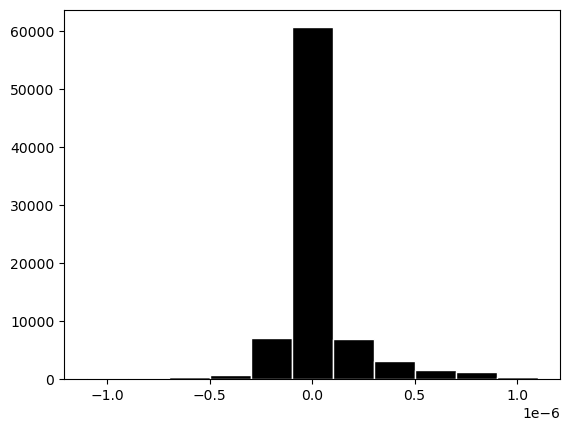

In [35]:
plt.hist((fcnn_prediction_val-y_val).detach().numpy(), np.arange(-1.1e-6,1.1e-6,2e-7), color="black", ec="white")

In [2]:
(6.46-2.09)/6.46

0.6764705882352942

In [12]:
import json

with open(os.path.join(data_directory, f'{dataset_name}_training_set_cases.json'), 'r') as file:
    gotm_case_dict = json.load(file)

with open(os.path.join(data_directory, f'{validation_dataset_name}_training_set_cases.json'), 'r') as file:
    gotm_validation_case_dict = json.load(file)

In [13]:
n_timesteps = np.load(f"{dataset_name}_dataset_M_target_dropped_first_inertial_T_timesteps.npy")
n_timesteps_val = np.load(f"{validation_dataset_name}_dataset_M_target_dropped_first_inertial_T_timesteps.npy")

/tmp/ipykernel_2023484/1124332659.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(tight_layout=True, figsize=(10,3))


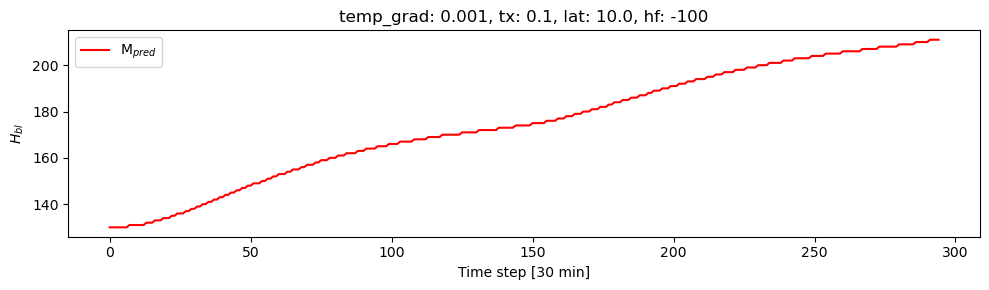

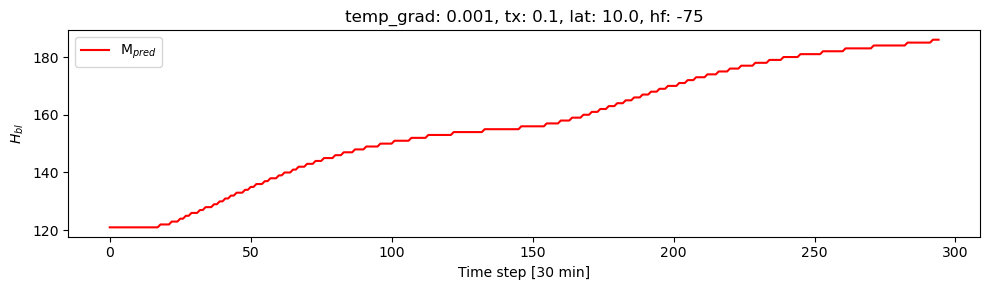

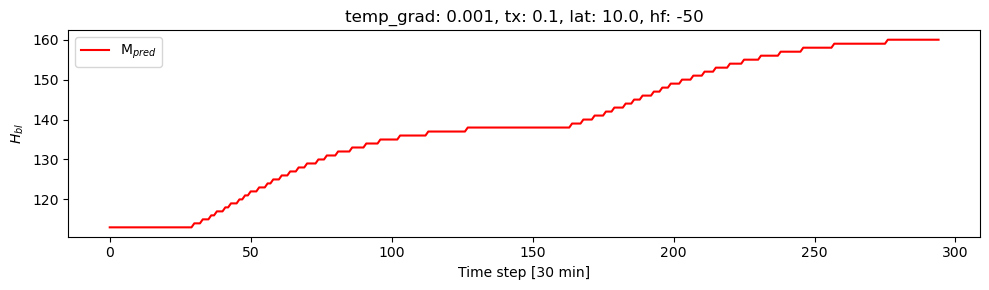

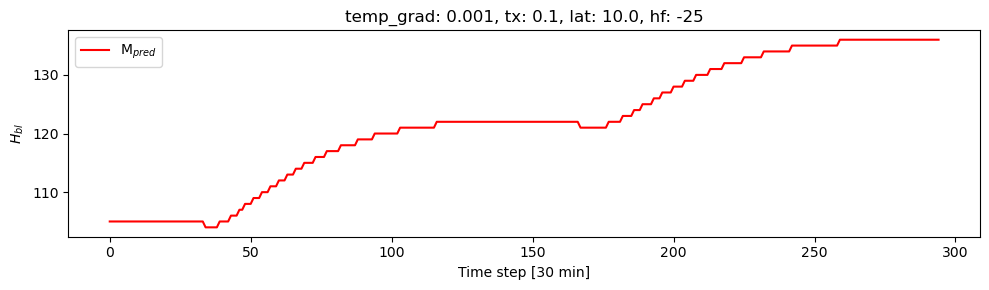

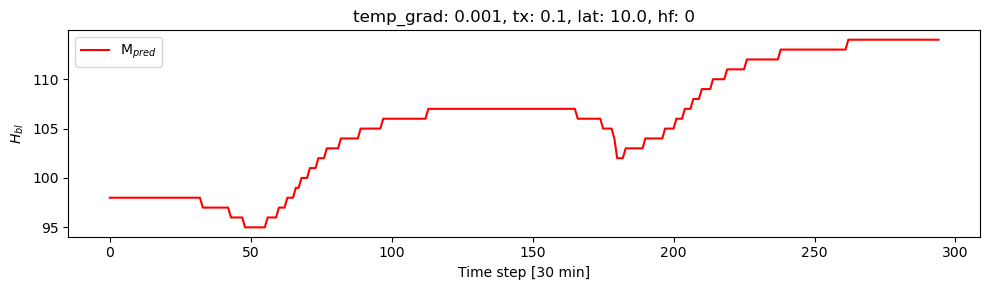

...

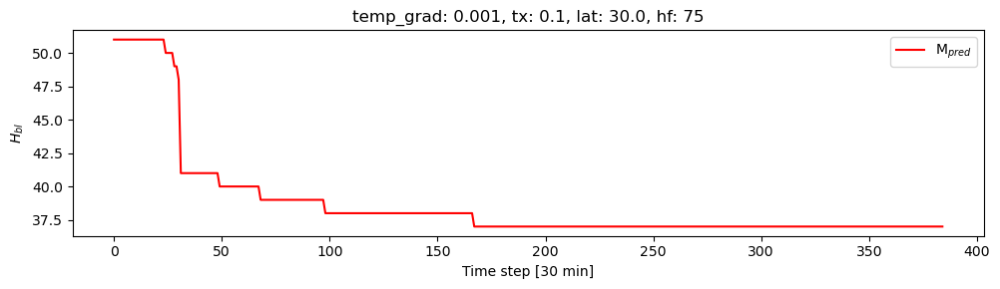

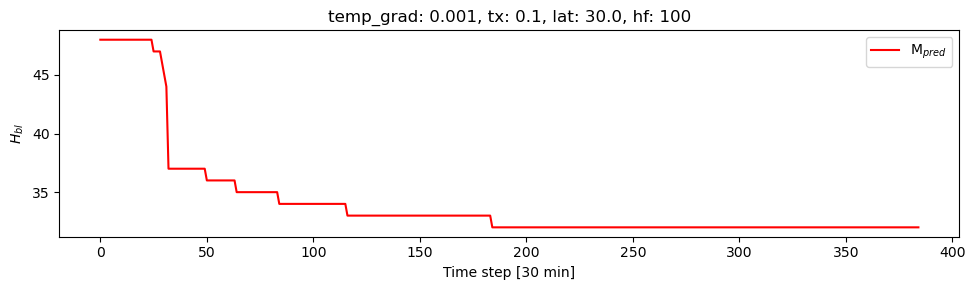

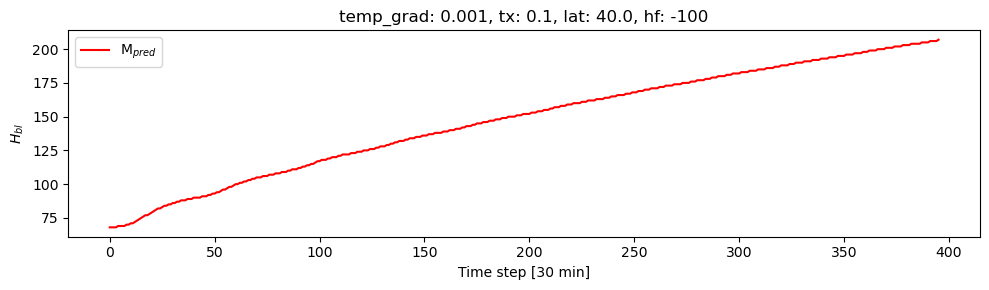

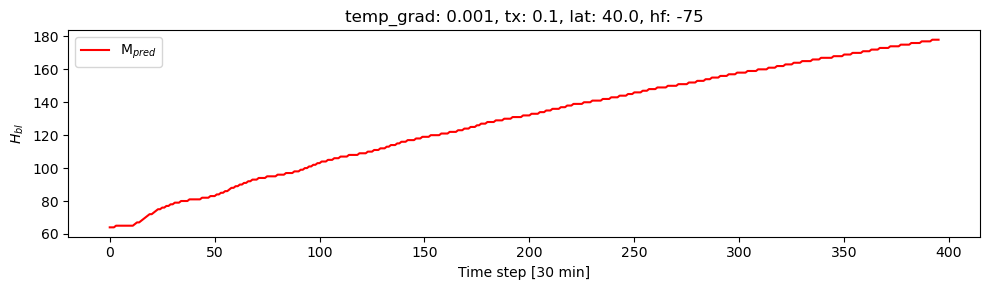

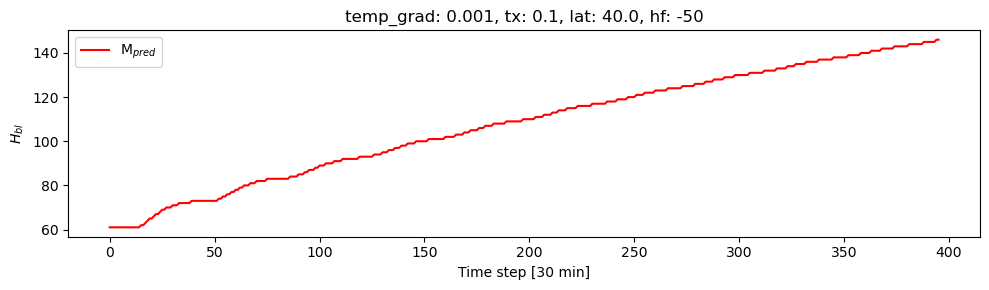

In [53]:
current_timestep = 0

for i in range(30):
    case_specs = gotm_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    plt.figure(tight_layout=True, figsize=(10,3))
    plt.title(f"temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    plt.plot(X.detach().numpy()[current_timestep:current_timestep+n_timesteps[i],2], label="M$_{pred}$", color="red")
    # plt.plot(y[n_timesteps*i:n_timesteps*(i+1)], label="M$_{true}$", color="black")
    plt.xlabel("Time step [30 min]")
    plt.ylabel("$H_{bl}$")
    plt.legend()
    current_timestep += n_timesteps[i]

/tmp/ipykernel_2023484/2747518779.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(tight_layout=True, figsize=(10,3))


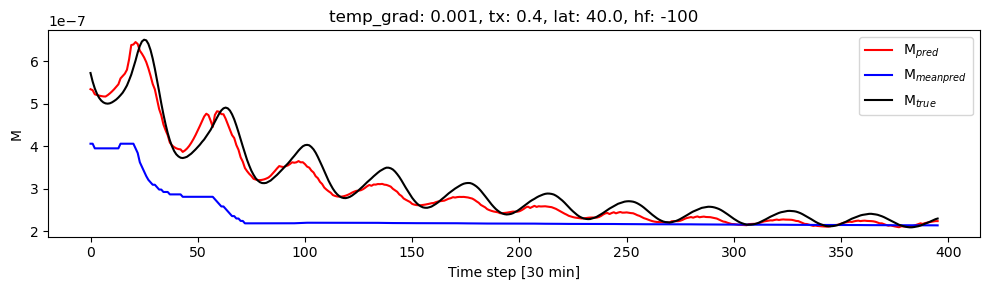

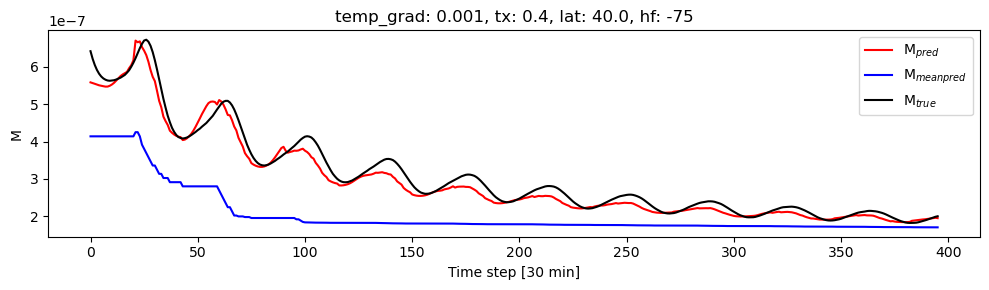

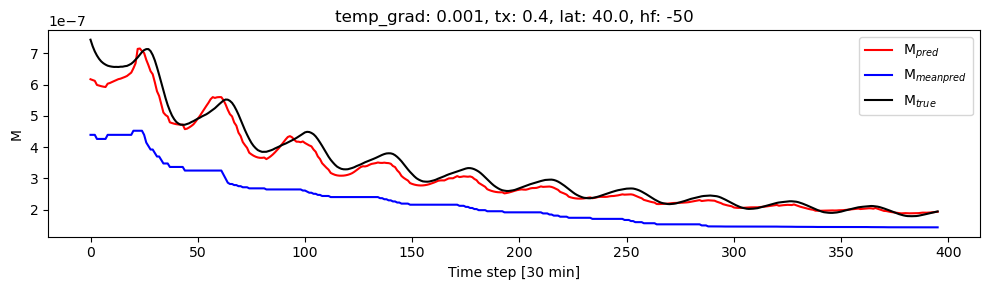

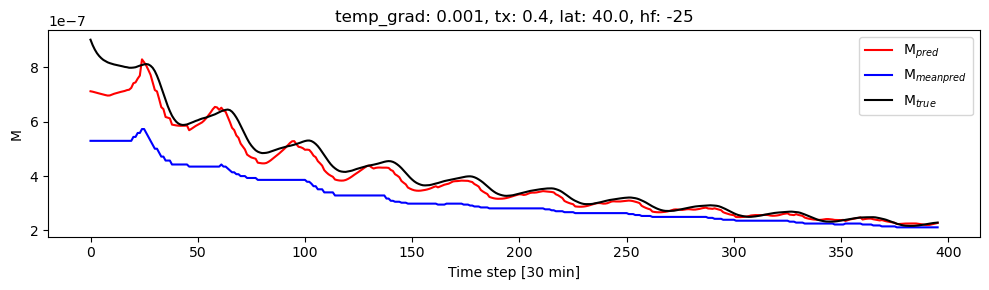

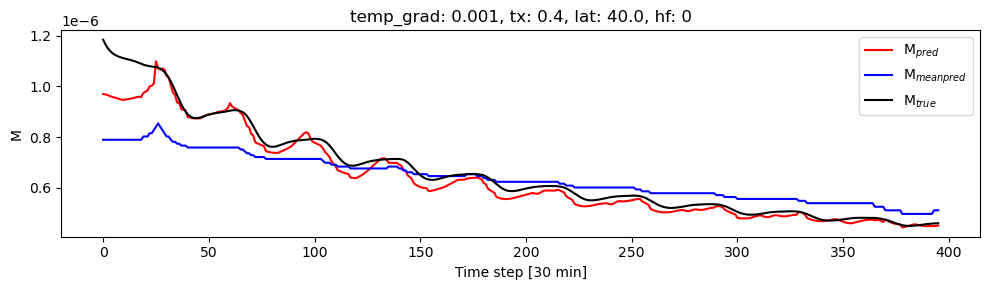

...

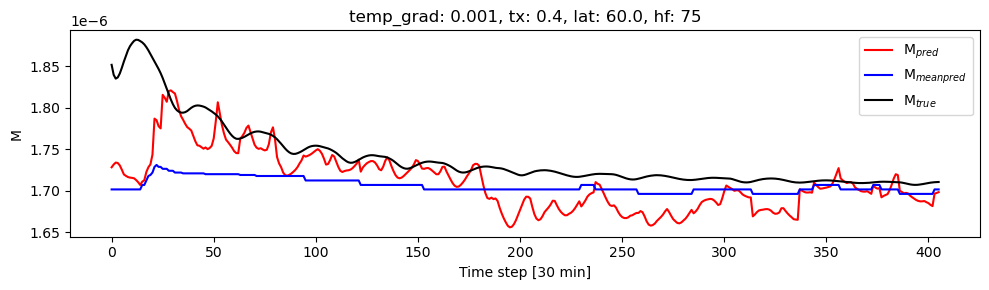

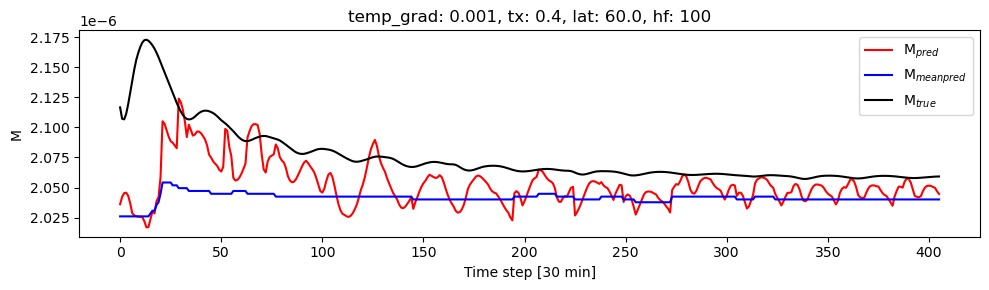

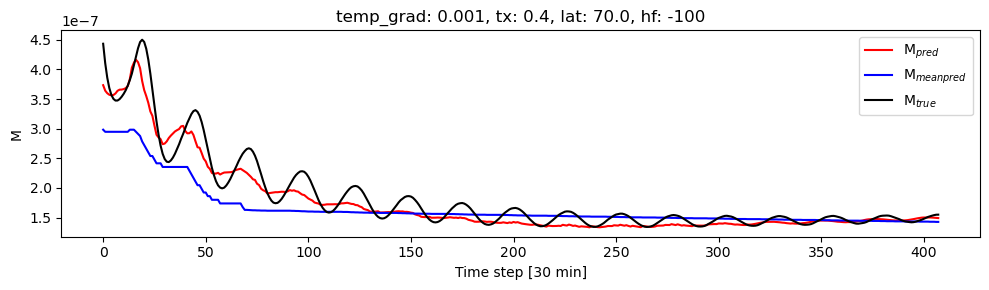

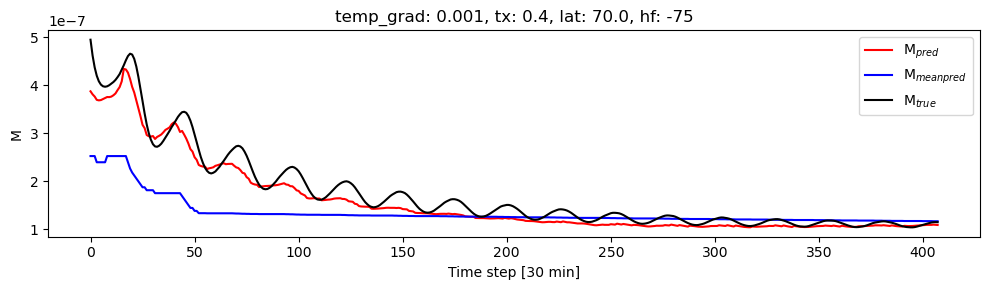

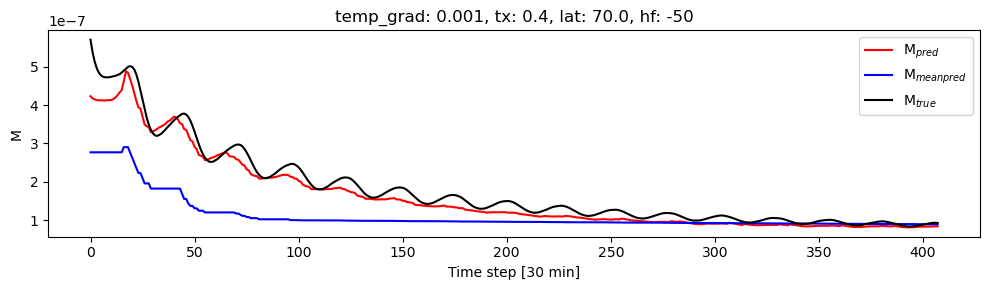

In [83]:
start, end = 270, 300
current_timestep = sum(n_timesteps[:start])

for i in range(start, end):
    case_specs = gotm_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    plt.figure(tight_layout=True, figsize=(10,3))
    plt.title(f"temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    plt.plot(fcnn_prediction.detach().numpy()[current_timestep:current_timestep+n_timesteps[i]], label="M$_{pred}$", color="red")
    plt.plot(mean_prediction.detach().numpy()[current_timestep:current_timestep+n_timesteps[i]], label="M$_{mean pred}$", color="blue")
    plt.plot(y[current_timestep:current_timestep+n_timesteps[i]], label="M$_{true}$", color="black")
    plt.xlabel("Time step [30 min]")
    plt.ylabel("M")
    plt.legend()
    current_timestep += n_timesteps[i]

/tmp/ipykernel_565158/4113290090.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(tight_layout=True, figsize=(10,3))


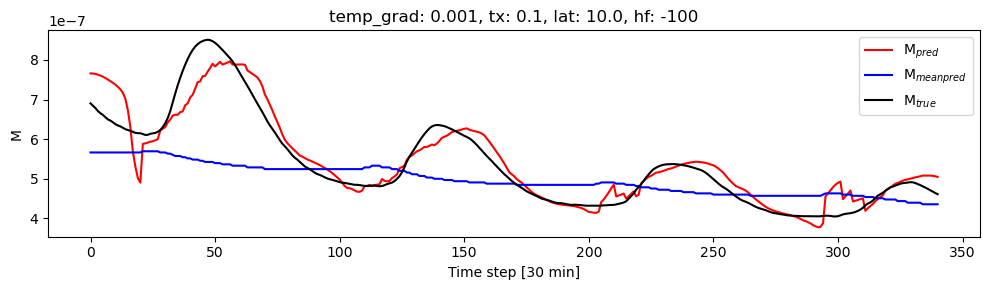

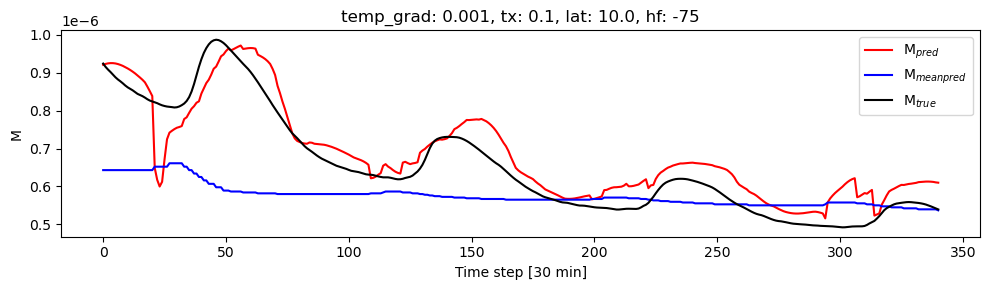

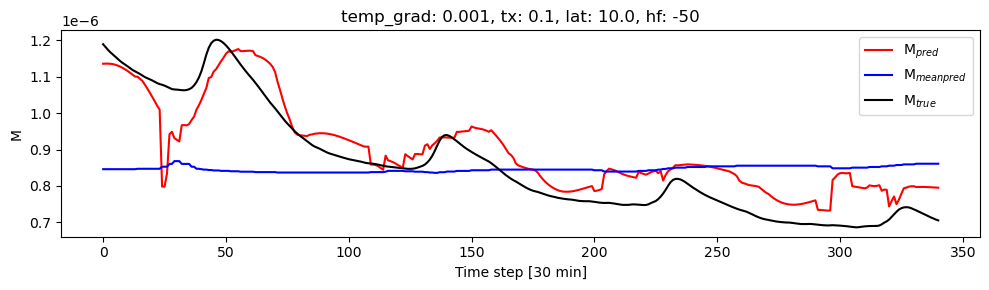

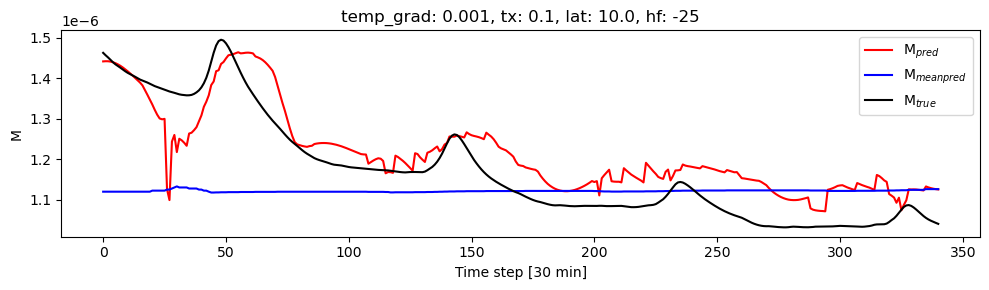

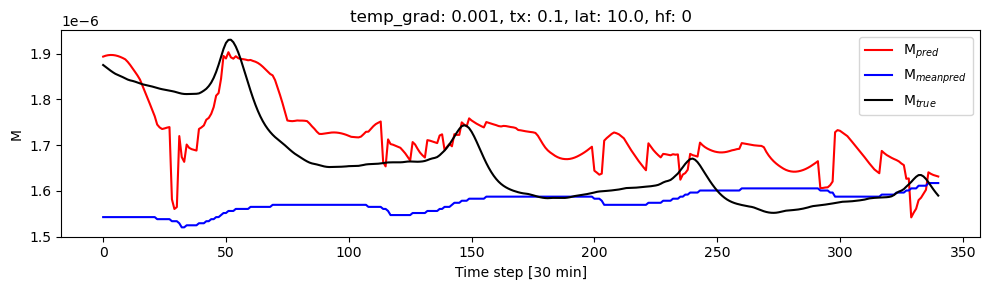

...

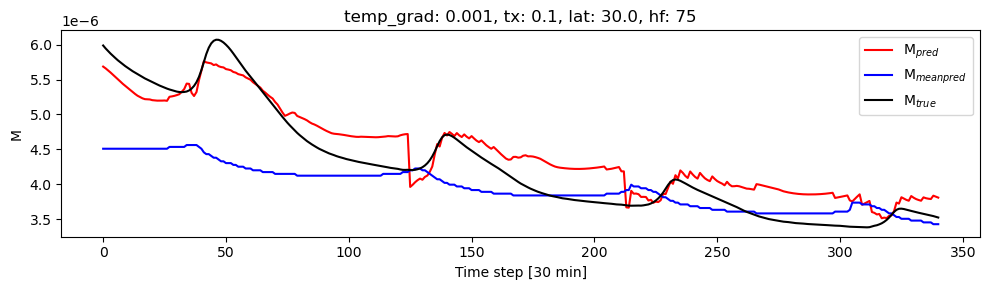

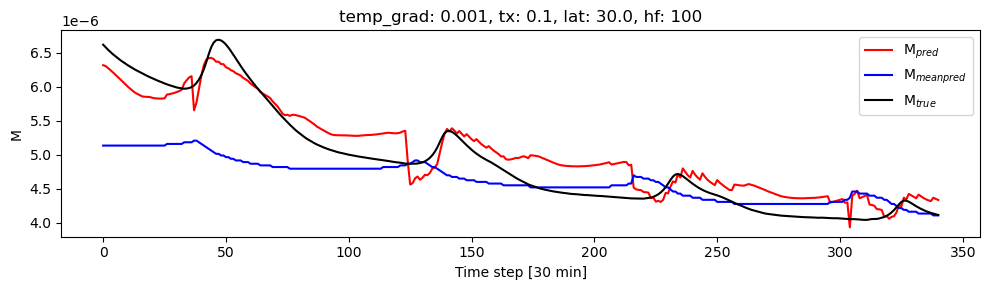

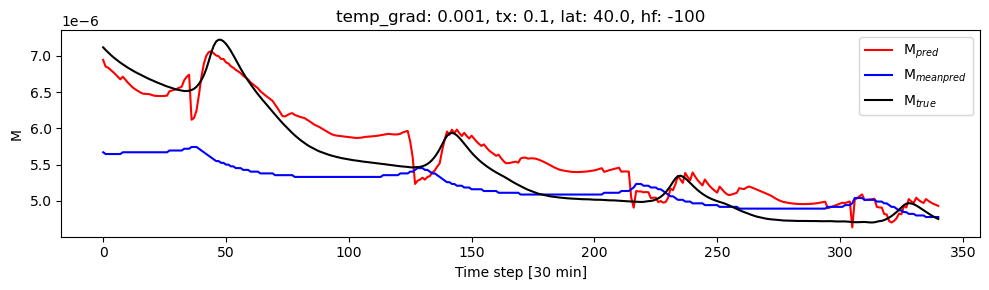

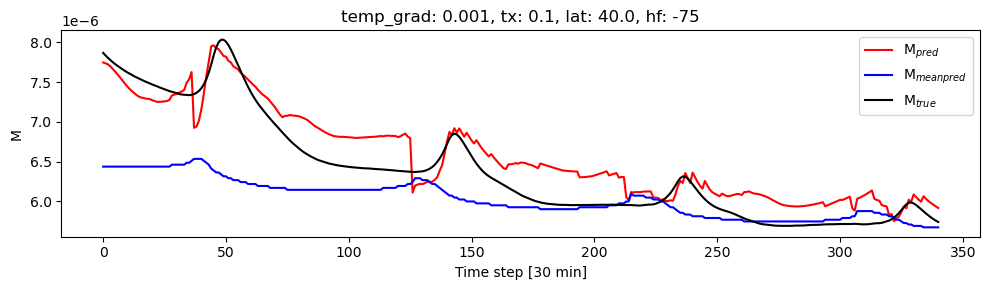

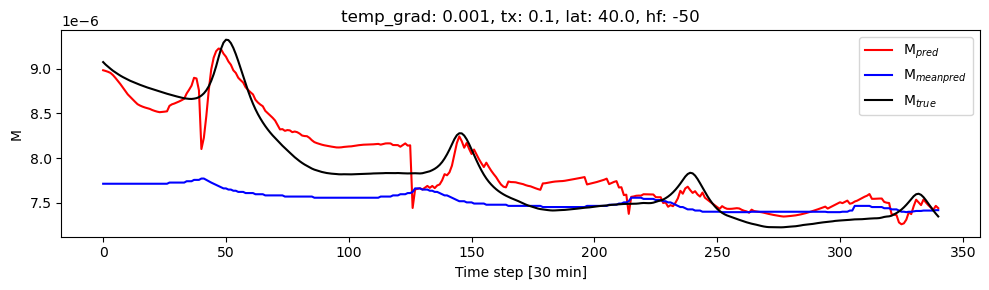

In [151]:
start, end = 0, 30
current_timestep = sum(n_timesteps_val[:start])

for i in range(start, end):
    case_specs = gotm_case_dict[f"case_{i+1}"]
    tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    plt.figure(tight_layout=True, figsize=(10,3))
    plt.title(f"temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    plt.plot(fcnn_prediction_val.detach().numpy()[current_timestep:current_timestep+n_timesteps_val[i]], label="M$_{pred}$", color="red")
    plt.plot(mean_prediction_val.detach().numpy()[current_timestep:current_timestep+n_timesteps_val[i]], label="M$_{mean pred}$", color="blue")
    plt.plot(y_val[current_timestep:current_timestep+n_timesteps_val[i]], label="M$_{true}$", color="black")
    plt.xlabel("Time step [30 min]")
    plt.ylabel("M")
    plt.legend()
    current_timestep += n_timesteps_val[i]

In [93]:
from matplotlib.ticker import StrMethodFormatter

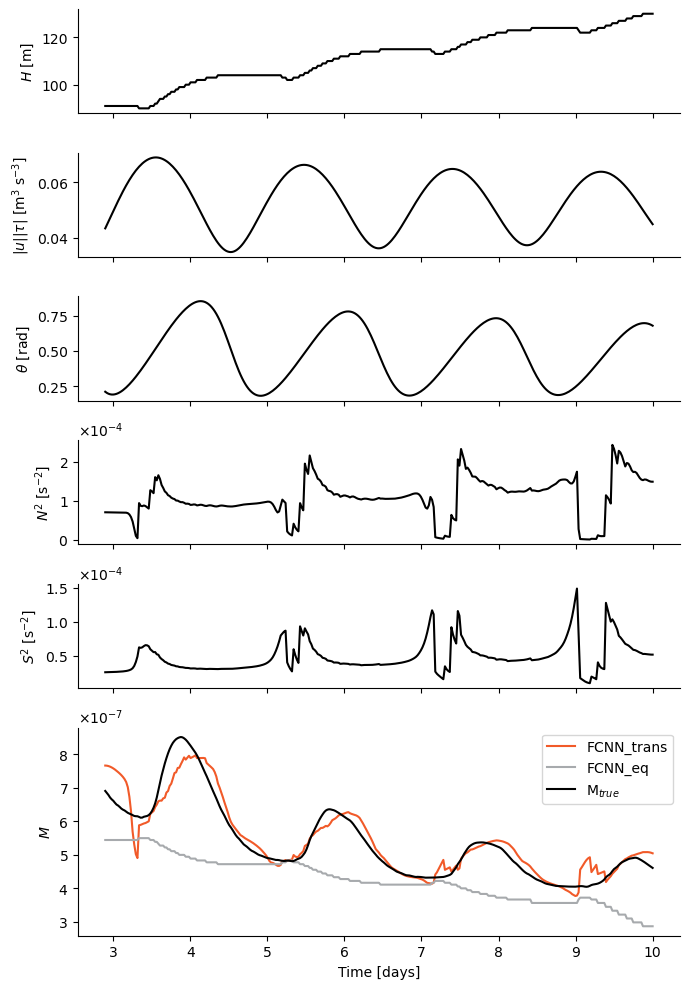

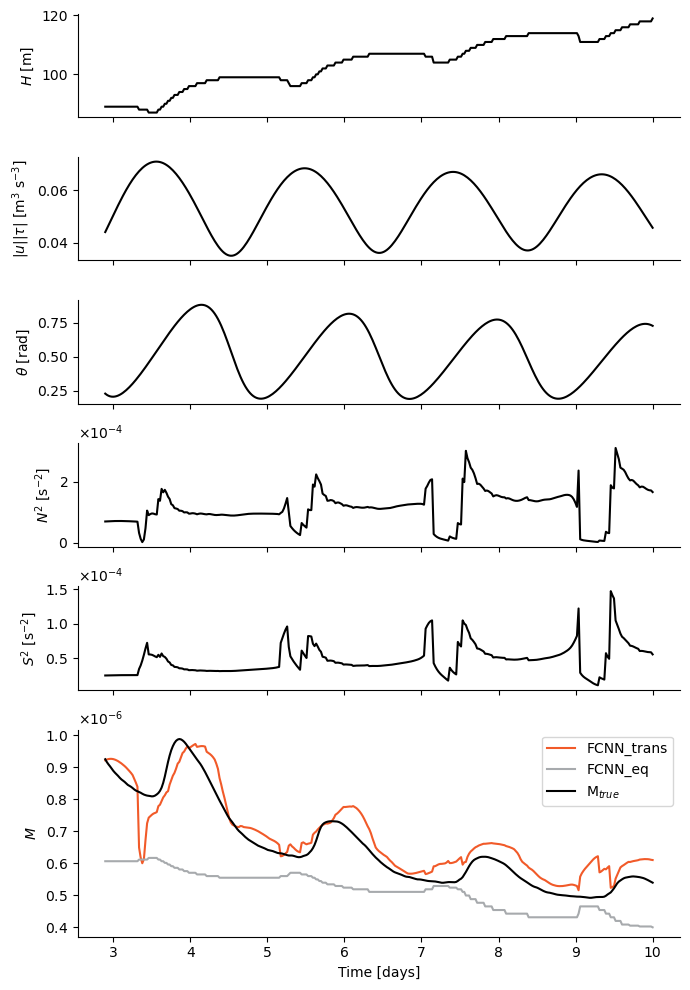

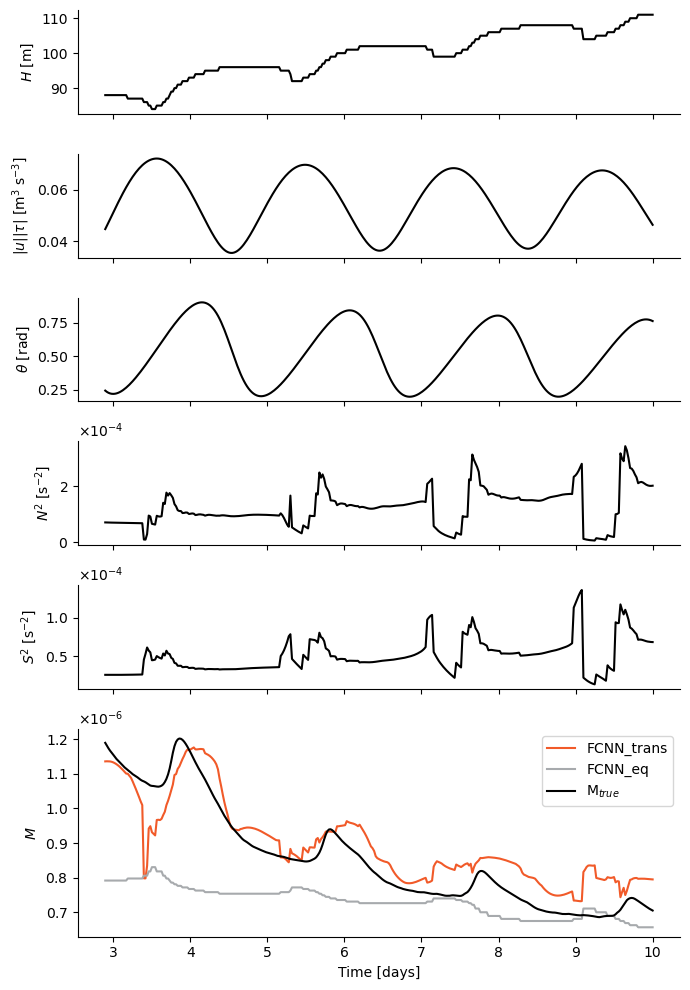

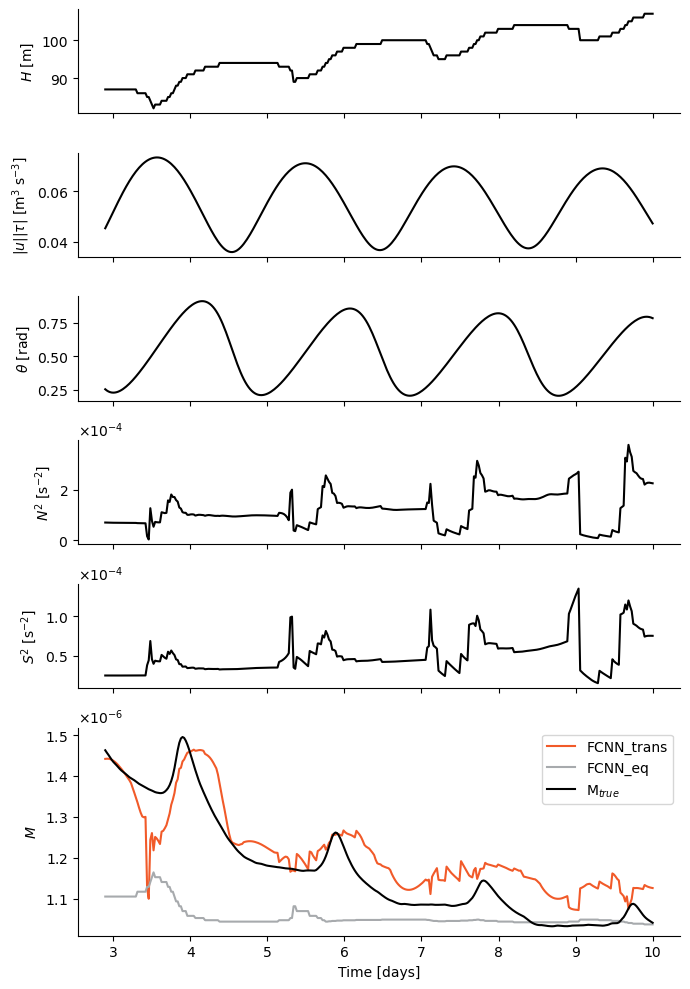

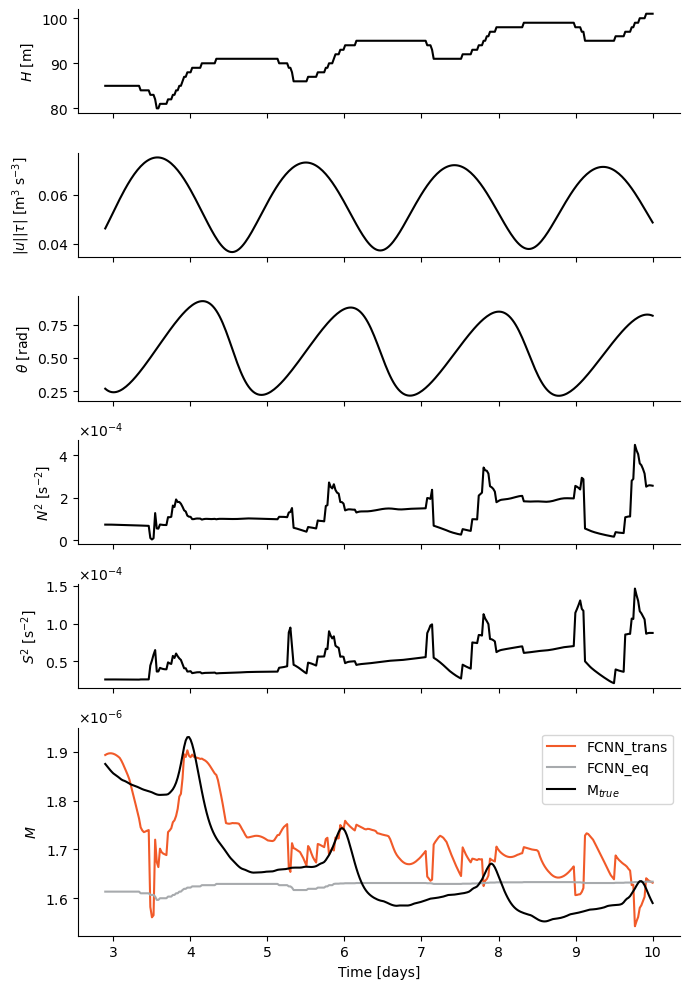

...

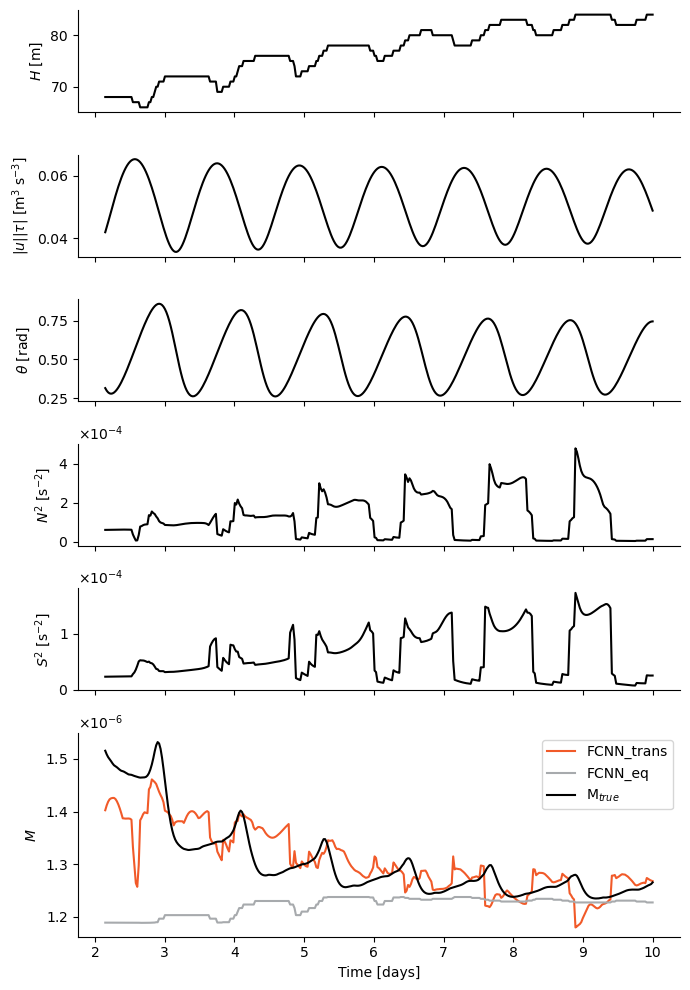

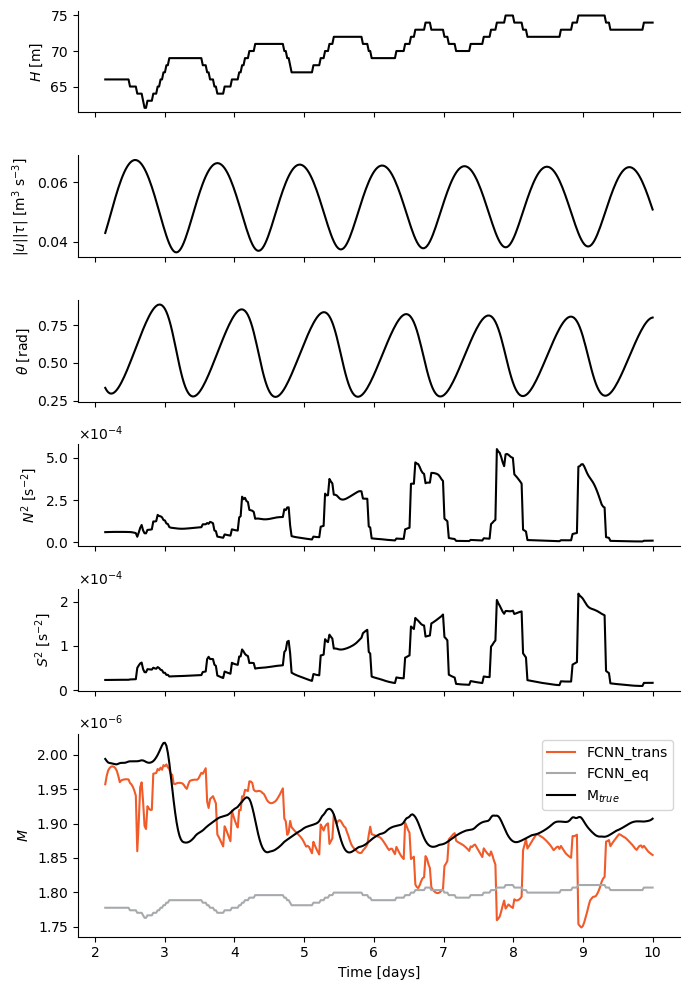

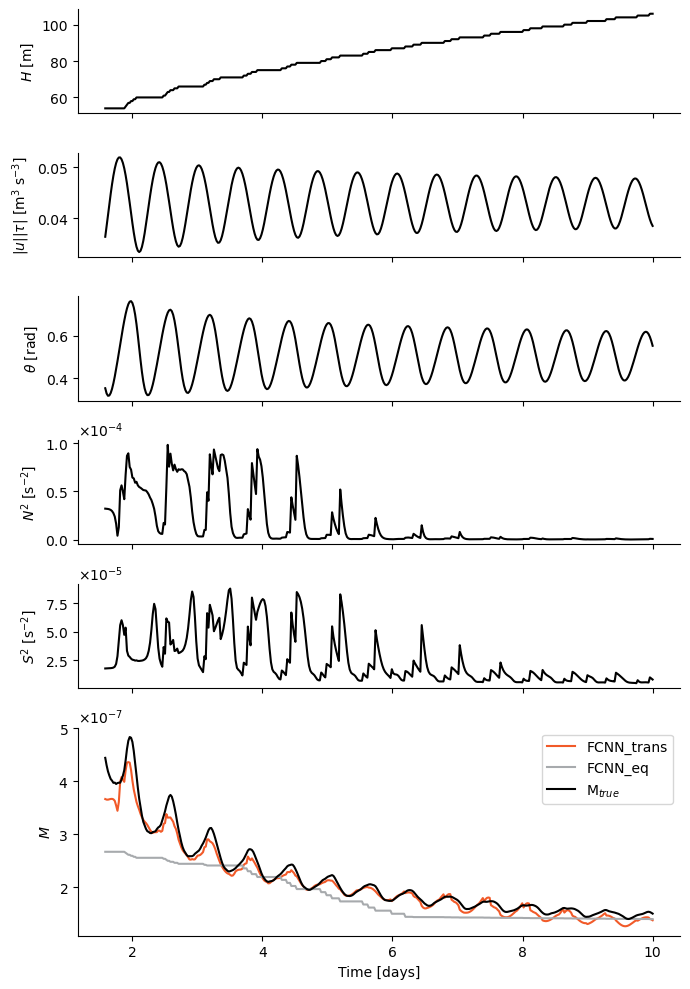

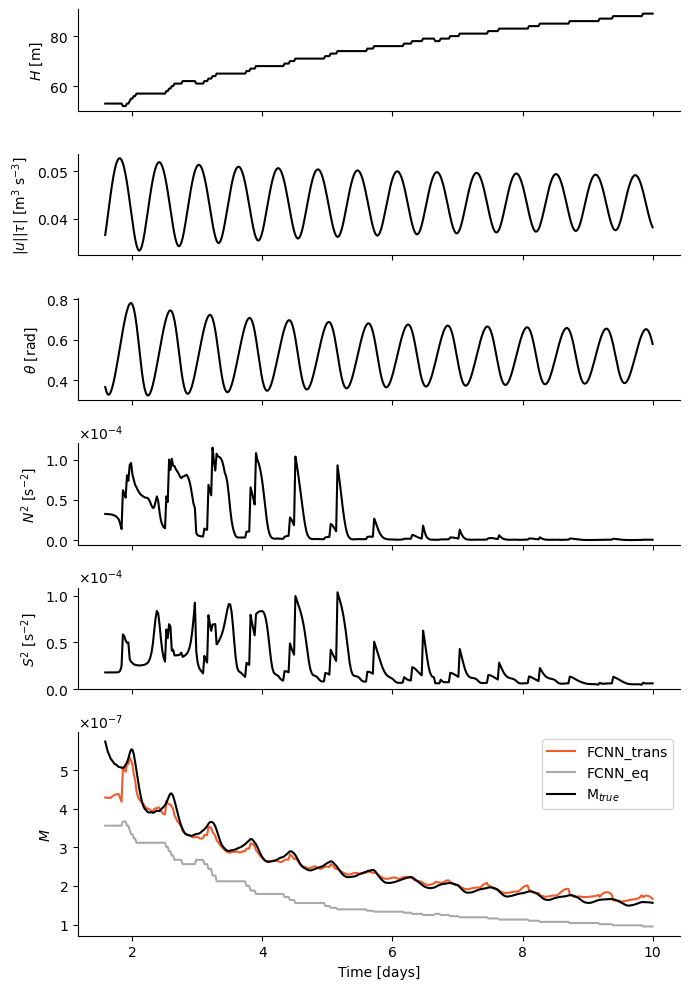

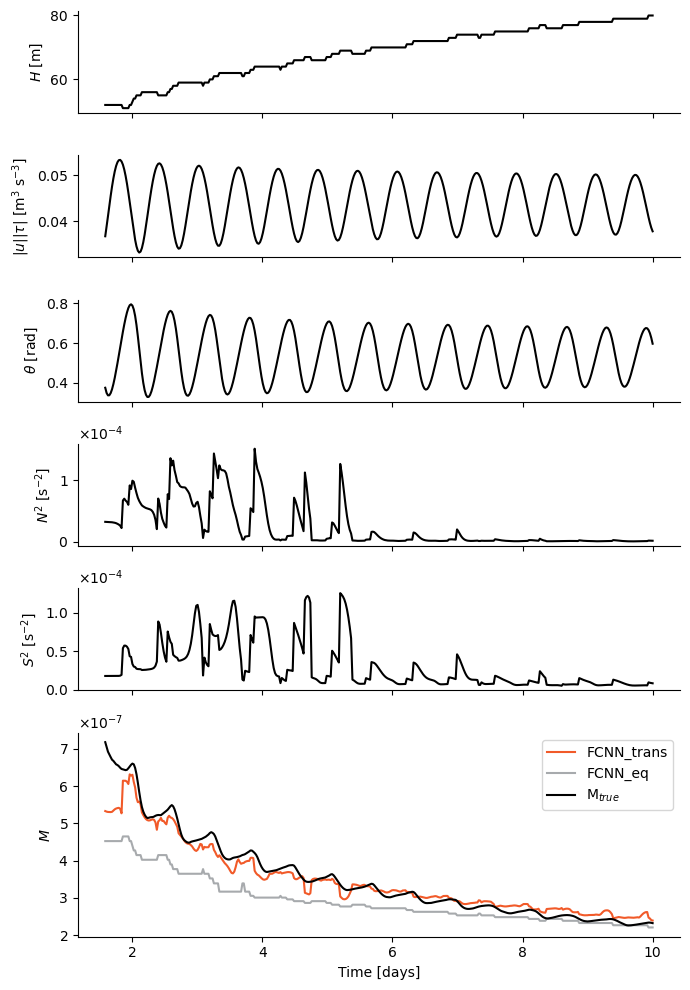

In [14]:
start, end = 0, 15
current_timestep = sum(n_timesteps_val[:start])
save=True

for i in range(start, end):
    end_time = 10
    start_time = 10 - n_timesteps_val[i] / 2 / 24

    time = np.linspace(start_time, end_time, n_timesteps_val[i])
    fig, ax = plt.subplots(6,1,figsize=(7,10), sharex=True, tight_layout=True,  
                           gridspec_kw={'height_ratios': [1, 1, 1, 1, 1, 2]})

    for a in ax.flatten():
        a.spines['top'].set_visible(False)
        a.spines['right'].set_visible(False)

    ax[0].plot(time, X_val[current_timestep:current_timestep+n_timesteps_val[i],2].detach().numpy(), color="black")
    ax[0].set_ylabel("$H$ [m]")

    ax[1].plot(time, X_val[current_timestep:current_timestep+n_timesteps_val[i],4].detach().numpy(), color="black")
    ax[1].set_ylabel(r"$|u||\tau|$ [m$^3$ s$^{-3}$]" )

    ax[2].plot(time, X_val[current_timestep:current_timestep+n_timesteps_val[i],5].detach().numpy(), color="black")
    ax[2].set_ylabel(r"$\theta$ [rad]")

    ax[3].plot(time, X_val[current_timestep:current_timestep+n_timesteps_val[i],6].detach().numpy(), color="black")
    ax[3].set_ylabel(r"$N^2$ [s$^{-2}$]")
    ax[3].ticklabel_format(style='sci', useMathText=True, scilimits=(-2, 2), axis='y')

    ax[4].plot(time, X_val[current_timestep:current_timestep+n_timesteps_val[i],7].detach().numpy(), color="black")
    ax[4].set_ylabel(r"$S^2$ [s$^{-2}$]")
    ax[4].ticklabel_format(style='sci', useMathText=True, scilimits=(-2, 2), axis='y')

    # case_specs = gotm_case_dict[f"case_{i+1}"]
    # tg, tx, lat, hf = case_specs['temp_grad'], case_specs['tx'], case_specs['lat'], case_specs['heat_flux']
    # plt.figure(tight_layout=True, figsize=(10,3))
    # plt.title(f"temp_grad: {tg}, tx: {tx}, lat: {lat}, hf: {hf}")
    ax[5].plot(time, fcnn_prediction_val.detach().numpy()[current_timestep:current_timestep+n_timesteps_val[i]], label="FCNN_trans", color="#f15a29")
    ax[5].plot(time, mean_prediction_val.detach().numpy()[current_timestep:current_timestep+n_timesteps_val[i]], label="FCNN_eq", color="#a7aaad")
    ax[5].plot(time, y_val[current_timestep:current_timestep+n_timesteps_val[i]], label="M$_{true}$", color="black")
    ax[5].set_xlabel("Time [days]")
    ax[5].set_ylabel("$M$")
    ax[5].legend()
    ax[5].ticklabel_format(style='sci', useMathText=True, scilimits=(-2, 2), axis='y')
    current_timestep += n_timesteps_val[i]

    if save:
        plt.savefig(f"figures/case_{i+1}_input_and_prediction_time_series.png", dpi=600)